## Jovian course-project-real-world-machine-learning-model  
> 

## 16) New Song Recommendation



<img src="https://images.pexels.com/photos/7803627/pexels-photo-7803627.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940"  width="600"/>


## EMI Music Data Science Hackathon - July 21st - 24 hours

Can you predict if a listener will love a new song?

### EMI Music Data Science Challenge Database

In [1]:
!pip install jovian --upgrade --quiet

In [2]:
import jovian

In [3]:
# Execute this to save new versions of the notebook
jovian.commit(project="course-project-real-world-machine-learning-model")

<IPython.core.display.Javascript object>

[jovian] Updating notebook "mmali9719/course-project-real-world-machine-learning-model" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/mmali9719/course-project-real-world-machine-learning-model


'https://jovian.ai/mmali9719/course-project-real-world-machine-learning-model'

Let's begin by installing the required libraries.

In [4]:
!pip install numpy pandas plotly matplotlib seaborn --quiet

In [5]:
!pip install jovian opendatasets xgboost graphviz lightgbm scikit-learn xgboost lightgbm --upgrade --quiet

## Problem Statement
We will download the database from Kaggle challenge: https://www.kaggle.com/c/MusicHackathon/data 

> Modeling objective: To predict if a listener will love a new song (from 0 to 100 Rating score)
>
> Type of the problem: Regression Problem
>
> The data includes mainly: ratings given by the users (as target data), users demographics, qualitative feedback after listening to the song (a list of words), answers to attitude towards music questions and music habit questions. We will use these data to predict the rating for the test set.



## Ploting Setup

In [6]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (12, 8)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Downloading the Data

In [7]:
import os
import opendatasets as od
import pandas as pd
import numpy as np
pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)

In [9]:
od.download('https://www.kaggle.com/c/MusicHackathon/data')

100%|█████████████████████████████████████████████████████████████████████████████| 6.62M/6.62M [00:02<00:00, 3.27MB/s]


Extracting archive .\MusicHackathon/MusicHackathon.zip to .\MusicHackathon


In [10]:
os.listdir('MusicHackathon')

['artists_mean_benchmark.csv',
 'global_mean_benchmark.csv',
 'logo_greenplum_main.png',
 'sample.r',
 'test.csv',
 'tracks_mean_benchmark.csv',
 'train.csv',
 'UserKey.csv',
 'users.csv',
 'users_mean_benchmark.csv',
 'words.csv']

Load the data into Pandas DataFrames

In [11]:
train_orig_df = pd.read_csv('./MusicHackathon/train.csv')
test_orig_df = pd.read_csv('./MusicHackathon/test.csv')
words_orig_df = pd.read_csv('./MusicHackathon/words.csv', encoding = "ISO-8859-1")
users_orig_df = pd.read_csv('./MusicHackathon/users.csv')

In [12]:
train_orig_df

,Artist,Track,User,Rating,Time
0,40,179,47994,9,17
1,9,23,8575,58,7
2,46,168,45475,13,16
3,11,153,39508,42,15
4,14,32,11565,54,19
...,...,...,...,...,...
188685,0,3,1278,29,6
188686,1,6,2839,30,18
188687,10,142,35756,61,12
188688,22,54,20163,46,21


In [13]:
test_orig_df

,Artist,Track,User,Time
0,1,6,3475,18
1,6,149,39210,15
2,40,177,47861,17
3,31,79,27413,11
4,26,66,23232,22
...,...,...,...,...
125789,14,95,30004,23
125790,10,25,8186,7
125791,40,146,38180,13
125792,22,113,32918,0


In [14]:
words_orig_df

,Artist,User,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,Uninspired,Sophisticated,Aggressive,Edgy,Sociable,Laid back,Wholesome,Uplifting,Intriguing,Legendary,Free,Thoughtful,Outspoken,Serious,Good lyrics,Unattractive,Confident,Old,Youthful,Boring,Current,Colourful,Stylish,Cheap,Irrelevant,Heartfelt,Calm,Pioneer,Outgoing,Inspiring,Beautiful,Fun,Authentic,Credible,Way out,Cool,Catchy,Sensitive,Mainstream,Superficial,Annoying,Dark,Passionate,Not authentic,Good Lyrics,Background,Timeless,Depressing,Original,Talented,Worldly,Distinctive,Approachable,Genius,Trendsetter,Noisy,Upbeat,Relatable,Energetic,Exciting,Emotional,Nostalgic,None of these,Progressive,Sexy,Over,Rebellious,Fake,Cheesy,Popular,Superstar,Relaxed,Intrusive,Unoriginal,Dated,Iconic,Unapproachable,Classic,Playful,Arrogant,Warm,Soulful,Unnamed: 87
0,47,45969,Heard of,NaN,NaN,NaN,0.0,NaN,0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,1.0,0,0.0,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0,0,0,0,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0,NaN,0,0,NaN,0,0,0.0,0,NaN,0.0,NaN,0,0.0,0.0,NaN,0,NaN,0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,0.0,NaN
1,35,29118,Never heard of,NaN,NaN,0.0,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0,NaN,0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,0,1,0,0,NaN,0,1.0,0.0,0.0,0.0,0.0,NaN,0,0.0,NaN,NaN,0,0.0,0,0,NaN,1,0,NaN,0,0.0,0.0,0.0,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
2,14,31544,Heard of,NaN,NaN,0.0,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0,NaN,0,0.0,0.0,NaN,1.0,NaN,0.0,0.0,1,0,0,0,NaN,0,0.0,0.0,0.0,0.0,0.0,NaN,0,0.0,NaN,NaN,0,0.0,0,1,NaN,0,0,NaN,0,0.0,0.0,0.0,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
3,23,18085,Never heard of,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0,NaN,0,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0,0,0,0,NaN,0,0.0,0.0,0.0,0.0,NaN,NaN,0,NaN,NaN,NaN,0,0.0,0,0,NaN,0,0,NaN,0,0.0,0.0,0.0,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
4,23,18084,Never heard of,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0,NaN,0,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0,0,0,0,NaN,0,0.0,0.0,0.0,0.0,NaN,NaN,0,NaN,NaN,NaN,0,0.0,0,0,NaN,0,0,NaN,0,0.0,0.0,0.0,0,NaN,NaN,NaN,1,NaN,0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118296,4,3932,Heard of and listened to music EVER,Own a little of their music,26.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0,NaN,0,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0,0,0,0,NaN,0,0.0,0.0,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,0,0.0,0,0,NaN,0,0,NaN,0,0.0,0.0,NaN,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,1.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
118297,4,3935,Heard of and listened to music EVER,Own a little of their music,30.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0,NaN,0,1.0,NaN,NaN,0.0,NaN,0.0,0.0,0,0,0,0,NaN,0,0.0,0.0,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,0,0.0,1,0,NaN,0,0,NaN,0,0.0,1.0,NaN,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN
118298,12,11216,Heard of and listened to music RECENTLY,Own none of their music,71.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,1,NaN,0,0.0,NaN,NaN,0.0,NaN,0.0,0.0,1,1,0,0,NaN,0,1.0,0.0,0.0,0.0,NaN,NaN,0,NaN,NaN,NaN,0,0.0,0,0,NaN,0,1,NaN,0,0.0,0.0,0.0,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,1.0,0.0,0,NaN,NaN
118299,33,35142,Heard of and listened to music EVER,Own none of their music,31.0,NaN,NaN,

In [15]:
users_orig_df

,RESPID,GENDER,AGE,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19
0,36927,Female,60.0,Other,South,Music is important to me but not necessarily m...,1 hour,NaN,49.0,50.0,49.0,50.0,32.0,33.0,32.0,0.0,74.0,50.0,50.0,71.0,52.0,71.0,9.0,7.0,72.0,49.0,26.0
1,3566,Female,36.0,Full-time housewife / househusband,South,Music is important to me but not necessarily m...,1 hour,1 hour,55.0,55.0,62.0,9.0,9.0,9.0,10.0,11.0,55.0,12.0,65.0,65.0,80.0,79.0,51.0,31.0,68.0,54.0,33.0
2,20054,Female,52.0,Employed 30+ hours a week,Midlands,I like music but it does not feature heavily i...,1 hour,Less than an hour,11.0,50.0,9.0,8.0,45.0,10.0,30.0,29.0,8.0,50.0,94.0,51.0,74.0,66.0,27.0,46.0,73.0,8.0,31.0
3,41749,Female,40.0,Employed 8-29 hours per week,South,Music means a lot to me and is a passion of mine,2 hours,3 hours,81.0,80.0,88.0,88.0,31.0,31.0,51.0,30.0,8.0,76.0,74.0,64.0,73.0,85.0,61.0,77.0,76.0,78.0,88.0
4,23108,Female,16.0,Full-time student,North,Music means a lot to me and is a passion of mine,3 hours,6 hours,76.0,79.0,78.0,73.0,71.0,68.0,73.0,67.0,31.0,56.0,13.0,82.0,79.0,68.0,71.0,NaN,86.0,80.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48640,19361,Male,48.0,Self-employed,Midlands,I like music but it does not feature heavily i...,Less than an hour,2 hours,9.0,73.0,33.0,6.0,10.0,68.0,51.0,52.0,93.0,53.0,74.0,36.0,13.0,38.0,12.0,10.0,50.0,10.0,28.0
48641,17639,Female,60.0,Full-time housewife / househusband,Midlands,Music means a lot to me and is a passion of mine,2 hours,1 hour,26.0,50.0,49.0,58.0,59.0,48.0,6.0,5.0,88.0,58.0,62.0,79.0,17.0,24.0,30.0,6.0,73.0,20.0,21.0
48642,28753,Female,25.0,Employed 30+ hours a week,Midlands,Music means a lot to me and is a passion of mine,2 hours,6 hours,89.0,89.0,89.0,6.0,6.0,51.0,26.0,5.0,0.0,70.0,70.0,70.0,51.0,70.0,70.0,NaN,100.0,70.0,69.0
48643,26197,Male,44.0,Employed 30+ hours a week,Midlands,Music means a lot to me and is a passion of mine,2 hours,4 hours,95.0,97.0,97.0,98.0,97.0,99.0,100.0,99.0,100.0,97.0,98.0,99.0,97.0,99.0,99.0,99.0,100.0,91.0,96.0


## Update and trim 'words' dataframe

Before we merge the information from 'words' and 'users' into train and test sets. 

I'd like to preprocess words_orig_df, in particular the columns of 82 words that describe the artist after listening to tracks. 

After analyzing all 82 words, I would classify them into 3 main categories: positive, negative and neutral. Some words like 'Legendary' gives strong positive feeling, while other might be more subtle. 

The score system works like this: 
- for each value 1 in the positive columns, we add 1 point to the total score; 
- for each value 1 in the negative columns, we subtract 1 point to the total score;
- any 0 and NaN value don't impact the score;
- neutral columns get ignored, since they don't impact the score.

Therefore, for each row we are able to create a new column called 'words_score' that summarize the total points each row has.

For major details on the words columns classification, please see the file: 

In [16]:
# Create positive words list
pos_score = ['Sophisticated', 'Sociable', 'Laid back', 'Wholesome', 'Uplifting', 'Intriguing', 'Legendary', 'Free', 'Outspoken', 'Good lyrics', 'Confident', 'Youthful', 'Current', 'Colourful', 'Stylish', 'Heartfelt', 'Pioneer', 'Outgoing', 'Inspiring', 'Beautiful', 'Fun', 'Authentic', 'Credible', 'Way out', 'Cool', 'Catchy', 'Sensitive', 'Passionate', 'Good Lyrics', 'Timeless', 'Original', 'Talented', 'Distinctive', 'Approachable', 'Genius', 'Trendsetter', 'Upbeat', 'Relatable', 'Energetic', 'Exciting', 'Emotional', 'Nostalgic', 'Progressive', 'Sexy', 'Over', 'Popular', 'Superstar', 'Relaxed', 'Iconic', 'Classic', 'Playful', 'Warm', 'Soulful']

In [17]:
# Create negative words list
neg_score = ['Uninspired', 'Unattractive', 'Boring', 'Cheap', 'Irrelevant', 'Superficial', 'Annoying', 'Not authentic', 'Depressing', 'Noisy', 'Fake', 'Cheesy', 'Intrusive', 'Unoriginal', 'Dated', 'Unapproachable']

In [18]:
# Create a new column called 'words_score'
words_orig_df['plus_score'] = words_orig_df[pos_score].sum(axis=1)
words_orig_df['minus_score'] = words_orig_df[neg_score].sum(axis=1)
words_orig_df['words_score'] = words_orig_df['plus_score'] - words_orig_df['minus_score']

In [19]:
words_orig_df[words_orig_df.LIKE_ARTIST > 90].sample(10)

,Artist,User,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,Uninspired,Sophisticated,Aggressive,Edgy,Sociable,Laid back,Wholesome,Uplifting,Intriguing,Legendary,Free,Thoughtful,Outspoken,Serious,Good lyrics,Unattractive,Confident,Old,Youthful,Boring,Current,Colourful,Stylish,Cheap,Irrelevant,Heartfelt,Calm,Pioneer,Outgoing,Inspiring,Beautiful,Fun,Authentic,Credible,Way out,Cool,Catchy,Sensitive,Mainstream,Superficial,Annoying,Dark,Passionate,Not authentic,Good Lyrics,Background,Timeless,Depressing,Original,Talented,Worldly,Distinctive,Approachable,Genius,Trendsetter,Noisy,Upbeat,Relatable,Energetic,Exciting,Emotional,Nostalgic,None of these,Progressive,Sexy,Over,Rebellious,Fake,Cheesy,Popular,Superstar,Relaxed,Intrusive,Unoriginal,Dated,Iconic,Unapproachable,Classic,Playful,Arrogant,Warm,Soulful,Unnamed: 87,plus_score,minus_score,words_score
37864,17,14014,Heard of and listened to music RECENTLY,Own all or most of their music,91.0,NaN,0.0,NaN,0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0.0,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0,0,0,0,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0,NaN,0,0,NaN,0,0,0.0,0,NaN,0.0,NaN,0,1.0,0.0,NaN,0,NaN,0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,0.0,NaN,1.0,0.0,1.0
53141,7,8394,Heard of and listened to music RECENTLY,Own all or most of their music,93.0,NaN,0.0,NaN,0,0.0,0.0,NaN,0.0,1.0,NaN,1.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0.0,1,NaN,NaN,0.0,NaN,NaN,NaN,NaN,1,0,1,0,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,1,NaN,1.0,0.0,1,NaN,1,1,NaN,1,0,1.0,0,NaN,0.0,NaN,0,1.0,0.0,NaN,0,NaN,1,NaN,1.0,NaN,NaN,1.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,0,1.0,NaN,17.0,0.0,17.0
110334,4,37310,Heard of and listened to music RECENTLY,Own all or most of their music,95.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,1.0,1.0,0.0,1.0,NaN,1.0,0.0,0,NaN,1,0.0,NaN,NaN,1.0,NaN,1.0,1.0,1,1,1,0,NaN,1,1.0,1.0,NaN,0.0,NaN,NaN,1,NaN,NaN,NaN,1,0.0,1,1,NaN,1,0,NaN,1,0.0,1.0,NaN,1,NaN,NaN,NaN,0,NaN,1,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,1.0,1.0,0.0,1,NaN,NaN,24.0,0.0,24.0
103059,7,8664,Heard of and listened to music EVER,Own none of their music,97.0,NaN,1.0,NaN,1,0.0,1.0,NaN,0.0,1.0,NaN,1.0,0,1.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,0.0,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0,0,1,0,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0,NaN,0,1,NaN,1,0,0.0,1,NaN,0.0,NaN,1,1.0,0.0,NaN,0,NaN,0,NaN,1.0,NaN,NaN,1.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,0,0.0,NaN,13.0,0.0,13.0
88071,44,42876,Heard of and listened to music RECENTLY,Own a lot of their music,100.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,0.0,1.0,NaN,0.0,NaN,0,NaN,0,0.0,NaN,NaN,0.0,NaN,1.0,0.0,0,0,0,0,NaN,1,1.0,0.0,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,1,0.0,0,1,NaN,1,0,NaN,0,0.0,0.0,NaN,1,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0,NaN,NaN,8.0,0.0,8.0
30270,10,10389,Heard of and listened to music RECENTLY,Own a lot of their music,96.0,NaN,0.0,NaN,0,1.0,1.0,NaN,1.0,0.0,NaN,1.0,0,1.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0,1.0,0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,0,0,1,0,1.0,1,1.0,NaN,NaN,NaN,NaN,NaN,1,NaN,0.0,0.0,0,NaN,0,0,NaN,1,0,0.0,1,NaN,0.0,NaN,1,0.0,1.0,NaN,0,NaN,0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,1,0.0,NaN,17.0,0.0,17.0
113216,22,20094,Heard of and listened to music RECENTLY,Own all or most of their music,99.0,NaN,NaN,0.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,1.0,1.0,0.0,1.0,NaN,0.0,0.0,1,NaN,0,0.0,NaN,NaN,0.0,NaN,1.0,0.0,0,0,1,1,NaN,0,0.0,0.0,0.0,0.0,NaN,NaN,1,NaN,NaN,NaN,1,0.0,1,1,NaN,1,0,NaN,0,0.0,0.0,0.0,1,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,1.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0,NaN,NaN,13.0,0.0,13.0
17083,4,37643,Heard of and listened to music RECENTLY,Own a lot of their music,97.0,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,1.0,0.0,0.0,NaN,0.0,0.0,0,NaN,0,0.0,NaN,NaN,0.0,NaN,0.0,1.0,1,0,1,1,NaN,1,1.0,1.0,NaN,0.0,NaN,NaN,1,NaN,NaN,NaN,1,0.0,1,1,NaN,0,0,NaN,0,0.0,0.0,NaN,0,NaN,NaN,NaN,0,NaN,0,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0,NaN,NaN,13.0,0.0,13.0
28592,40,50262

We select a bunch of rows with LIKE_ARTIST higher than 90, to check if our enginerred column words_score has any meaningful numbers. It turns out that the words_score are usually high. Which is good.

At this point, we can clean up the words_orig_df, since we can use the words_score and we don't need anymore all the 82 columns of each word.

In [20]:
words_reduce_df = words_orig_df[['Artist', 'User', 'HEARD_OF', 'OWN_ARTIST_MUSIC', 'LIKE_ARTIST', 'words_score']]

In [21]:
words_reduce_df

,Artist,User,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score
0,47,45969,Heard of,NaN,NaN,-1.0
1,35,29118,Never heard of,NaN,NaN,3.0
2,14,31544,Heard of,NaN,NaN,2.0
3,23,18085,Never heard of,NaN,NaN,-1.0
4,23,18084,Never heard of,NaN,NaN,0.0
...,...,...,...,...,...,...
118296,4,3932,Heard of and listened to music EVER,Own a little of their music,26.0,-1.0
118297,4,3935,Heard of and listened to music EVER,Own a little of their music,30.0,1.0
118298,12,11216,Heard of and listened to music RECENTLY,Own none of their music,71.0,6.0
118299,33,35142,Heard of and listened to music EVER,Own none of their music,31.0,3.0


## Merge the information from words_reduce_df, users_orig_df into train_orig_df

In [22]:
# Rename column RESPID to User in the users_orig_df
users_orig_df.rename(columns={'RESPID': 'User'}, inplace=True)

In [23]:
train_merged_df = train_orig_df.merge(words_reduce_df, how='left', on=['Artist', 'User'])

In [24]:
train_merged_df = train_merged_df.merge(users_orig_df, how='left', on=['User'])

In [25]:
train_merged_df.shape

(188690, 35)

In [26]:
train_merged_df.sample(10)

,Artist,Track,User,Rating,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,AGE,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19
67366,46,166,45444,23,16,Heard of and listened to music EVER,Own none of their music,35.0,-1.0,Male,44.0,Employed 30+ hours a week,Midlands,Music means a lot to me and is a passion of mine,2 hours,4 hours,91.0,89.0,90.0,16.0,29.0,13.0,43.0,27.0,12.0,87.0,85.0,85.0,72.0,88.0,89.0,49.0,49.0,91.0,90.0
177034,26,65,23096,70,22,Never heard of,NaN,NaN,1.0,Female,NaN,Full-time student,North,Music is important to me but not necessarily m...,2 hours,0 Hours,72.0,47.0,67.0,32.0,46.0,30.0,11.0,12.0,50.0,36.0,36.0,35.0,8.0,50.0,67.0,NaN,50.0,49.0,49.0
151532,22,53,17962,49,21,Heard of and listened to music RECENTLY,Own none of their music,48.0,4.0,Male,36.0,Full-time housewife / househusband,Midlands,Music is important to me but not necessarily m...,Less than an hour,2 hours,23.0,83.0,47.0,26.0,49.0,29.0,52.0,25.0,33.0,29.0,52.0,22.0,67.0,41.0,49.0,16.0,28.0,22.0,23.0
104356,3,9,5156,13,18,Never heard of,NaN,NaN,1.0,Male,22.0,Employed 30+ hours a week,North,Music means a lot to me and is a passion of mine,1 hour,2 hours,19.0,60.0,60.0,48.0,70.0,48.0,81.0,46.0,21.0,78.0,47.0,53.0,39.0,57.0,69.0,52.0,54.0,77.0,65.0
125086,30,76,25252,5,22,Never heard of,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
114329,0,1,355,33,6,Never heard of,NaN,NaN,0.0,Male,54.0,NaN,South,Music has no particular interest for me,NaN,NaN,53.0,55.0,50.0,48.0,52.0,54.0,52.0,55.0,55.0,53.0,54.0,51.0,50.0,52.0,54.0,54.0,53.0,NaN,NaN
164067,12,30,12175,15,19,Heard of,NaN,NaN,-3.0,Female,43.0,Full-time housewife / househusband,North,Music means a lot to me and is a passion of mine,2 hours,1 hour,52.0,72.0,56.0,5.0,12.0,31.0,2.0,2.0,78.0,62.0,25.0,25.0,25.0,29.0,52.0,29.0,54.0,8.0,8.0
13964,0,3,1077,29,6,Never heard of,NaN,NaN,4.0,Female,45.0,NaN,Centre,I like music but it does not feature heavily i...,0,0,29.0,50.0,11.0,31.0,53.0,30.0,11.0,11.0,71.0,47.0,47.0,51.0,32.0,31.0,30.0,30.0,55.0,NaN,NaN
69970,28,72,24134,51,22,Never heard of,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24821,7,19,7714,18,7,Heard of and listened to music EVER,Own none of their music,56.0,6.0,Female,18.0,NaN,North,Music means a lot to me and is a passion of mine,3,2,98.0,47.0,100.0,29.0,27.0,16.0,33.0,17.0,15.0,71.0,30.0,30.0,72.0,65.0,64.0,16.0,92.0,NaN,NaN


In [27]:
# merge to the test set too

test_merged_df = test_orig_df.merge(words_reduce_df, how='left', on=['Artist', 'User'])
test_merged_df = test_merged_df.merge(users_orig_df, how='left', on=['User'])

In [28]:
test_merged_df

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,AGE,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19
0,1,6,3475,18,Heard of and listened to music EVER,Own none of their music,3.0,2.0,Female,48.0,Employed 30+ hours a week,South,Music means a lot to me and is a passion of mine,1 hour,3 hours,8.0,69.0,27.0,27.0,50.0,27.0,26.0,8.0,51.0,50.0,66.0,49.0,20.0,7.0,8.0,9.0,7.0,4.0,8.0
1,6,149,39210,15,NaN,NaN,NaN,NaN,Male,28.0,Employed 30+ hours a week,Midlands,Music is important to me but not necessarily m...,1 hour,1 hour,81.0,67.0,94.0,61.0,53.0,32.0,41.0,42.0,36.0,76.0,70.0,76.0,58.0,61.0,66.0,51.0,75.0,70.0,72.0
2,40,177,47861,17,Never heard of,NaN,NaN,-2.0,Female,59.0,Other,Midlands,Music is no longer as important as it used to ...,Less than an hour,Less than an hour,9.0,94.0,49.0,48.0,49.0,8.0,13.0,56.0,92.0,92.0,55.0,57.0,11.0,57.0,10.0,11.0,91.0,7.0,9.0
3,31,79,27413,11,Never heard of,NaN,NaN,0.0,Female,25.0,Employed part-time less than 8 hours per week,Midlands,I like music but it does not feature heavily i...,1 hour,1 hour,53.0,38.0,51.0,53.0,53.0,53.0,33.0,51.0,47.0,33.0,41.0,45.0,49.0,49.0,49.0,49.0,35.0,52.0,52.0
4,26,66,23232,22,Never heard of,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125789,14,95,30004,23,Heard of,NaN,NaN,12.0,Male,36.0,Employed 30+ hours a week,Midlands,Music means a lot to me and is a passion of mine,10 hours,4 hours,84.0,69.0,100.0,32.0,9.0,28.0,9.0,12.0,50.0,75.0,68.0,72.0,64.0,70.0,75.0,NaN,72.0,56.0,54.0
125790,10,25,8186,7,Never heard of,NaN,NaN,6.0,Male,49.0,NaN,North,I like music but it does not feature heavily i...,NaN,3,29.0,70.0,30.0,30.0,69.0,14.0,12.0,12.0,70.0,29.0,50.0,48.0,54.0,66.0,10.0,34.0,70.0,NaN,NaN
125791,40,146,38180,13,Heard of,NaN,NaN,3.0,Female,40.0,Full-time housewife / househusband,Midlands,Music means a lot to me and is a passion of mine,15 hours,9 hours,59.0,51.0,51.0,83.0,32.0,43.0,14.0,41.0,71.0,58.0,36.0,43.0,81.0,63.0,45.0,65.0,30.0,46.0,21.0
125792,22,113,32918,0,Ever heard music by,Own none of their music,48.0,2.0,Female,48.0,NaN,NaN,Music means a lot to me and is a passion of mine,0,1,69.0,30.0,76.0,74.0,73.0,11.0,11.0,11.0,92.0,34.0,74.0,72.0,36.0,37.0,9.0,9.0,64.0,NaN,NaN


## Exploratory Data Analysis

## Let's see the distribution of the target value: **Rating** - A number between X-100 which answers the question: How much do you like or dislike the music/the song?

In [29]:
px.histogram(train_merged_df, x='Rating', nbins=101, marginal='box', title='Rating Distribution')

**- Seems like we have three big peaks of values around: 10, 30, 50. And two small peaks around 70, 90;**

**- We don't know why of this shape of distribution. But clearly in terms of music rating, it seems like you tend to have more than one common rating.**

In [30]:
# Let's see the columns of the training data set
train_merged_df.columns

Index(['Artist', 'Track', 'User', 'Rating', 'Time', 'HEARD_OF',
       'OWN_ARTIST_MUSIC', 'LIKE_ARTIST', 'words_score', 'GENDER', 'AGE',
       'WORKING', 'REGION', 'MUSIC', 'LIST_OWN', 'LIST_BACK', 'Q1', 'Q2', 'Q3',
       'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10', 'Q11', 'Q12', 'Q13', 'Q14',
       'Q15', 'Q16', 'Q17', 'Q18', 'Q19'],
      dtype='object')

## Artist column - An anonymised identifier for the EMI artist. 

In [31]:
plot_order= train_merged_df.groupby('Artist')['Rating'].mean().sort_values(ascending=False).index.values

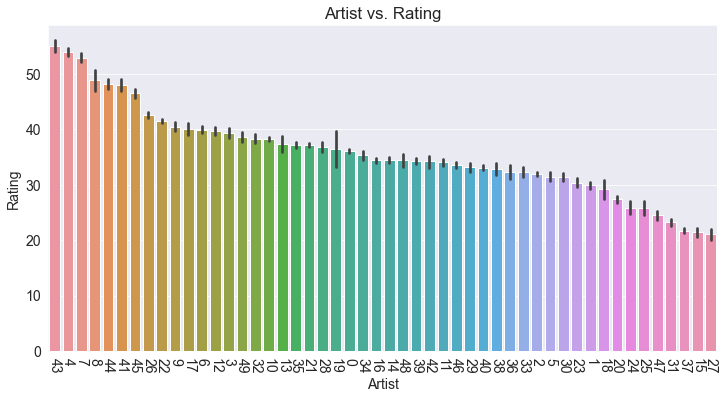

In [32]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Artist vs. Rating')
sns.barplot(x='Artist', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-90, ha='center')
plt.show();

**- Best artists are (at least in terms of mean rating): 43, 4, 7, 8, 44, 41;**

**- While the worst ones are: 27, 15, 37, 31;**

**- The difference is quite big, the best artists have ratings mean almost double than the worst ones.**

## Track - An anonymised identifier for the artist’s track (total 184 tracks)

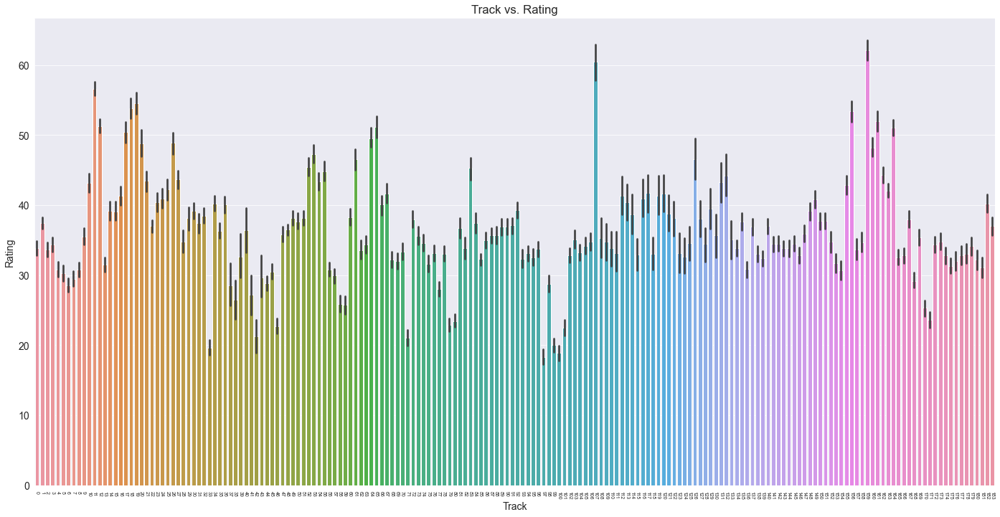

In [33]:
fig, ax = plt.subplots(figsize=(24,12))

# Add the plot
plt.title('Track vs. Rating')
sns.barplot(x='Track', y='Rating', data=train_merged_df)
plt.xticks(rotation=-90, fontsize=7, ha='center')
plt.show();

**- It's clear that certain track has a much higher rating than others, which makes this feature extremely important.**

## Time column - The time the market research was completed.

In [34]:
plot_order= train_merged_df.groupby('Time')['Rating'].mean().sort_values(ascending=False).index.values

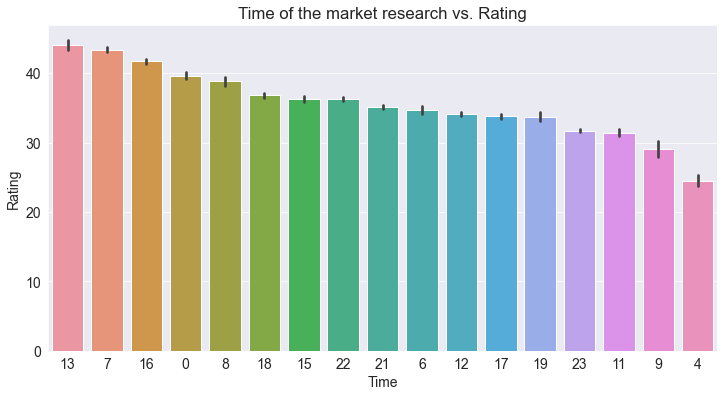

In [35]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Time of the market research vs. Rating')
sns.barplot(x='Time', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=0, ha='center')
plt.show();


**- The time the market research was completed seems has some impact on the mean values of rating;**

**- The explaination might be that in the batch no. 13 certain artists/tracks were researched, which had higher ratings. While artists/tracks in the batch no. 4 had lower ratings due to the lower appreciations by the users.**

### 'HEARD_OF' column - Have you heard of and/or heard music by this artist? 

- Let's change 'Ever heard of', NaN to 'Never heard of'.
- 'Listened to recently' to 'Heard of and listened to music RECENTLY'.
- 'Ever heard music by' to 'Heard of and listened to music EVER'  


So in the end, we will have only 4 categories for this column.

In [36]:
train_merged_df['HEARD_OF'].value_counts()

Never heard of                             94090
Heard of                                   35493
Heard of and listened to music EVER        29854
Heard of and listened to music RECENTLY    17847
Ever heard music by                         5136
Listened to recently                        2191
Ever heard of                               1807
Name: HEARD_OF, dtype: int64

In [37]:
train_merged_df['HEARD_OF'].isna().sum()

2272

In [38]:
train_merged_df['HEARD_OF'].replace(['Ever heard of'], 'Never heard of', inplace=True)
train_merged_df['HEARD_OF'].replace(['Ever heard music by'], 'Heard of and listened to music EVER', inplace=True)
train_merged_df['HEARD_OF'].replace(['Listened to recently'], 'Heard of and listened to music RECENTLY', inplace=True)
train_merged_df['HEARD_OF'].fillna('Never heard of', inplace=True)

In [39]:
# Do the same for the test set:
test_merged_df['HEARD_OF'].replace(['Ever heard of'], 'Never heard of', inplace=True)
test_merged_df['HEARD_OF'].replace(['Ever heard music by'], 'Heard of and listened to music EVER', inplace=True)
test_merged_df['HEARD_OF'].replace(['Listened to recently'], 'Heard of and listened to music RECENTLY', inplace=True)
test_merged_df['HEARD_OF'].fillna('Never heard of', inplace=True)

In [40]:
train_merged_df['HEARD_OF'].value_counts()

Never heard of                             98169
Heard of                                   35493
Heard of and listened to music EVER        34990
Heard of and listened to music RECENTLY    20038
Name: HEARD_OF, dtype: int64

In [41]:
plot_order= train_merged_df.groupby('HEARD_OF')['Rating'].mean().sort_values(ascending=False).index.values

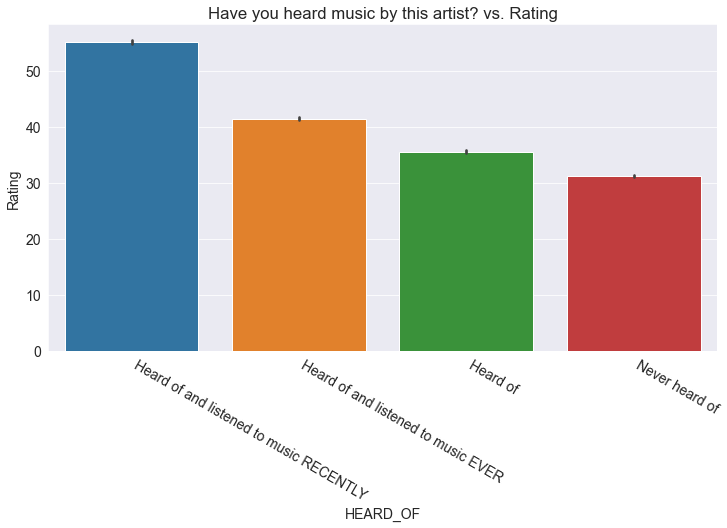

In [42]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Have you heard music by this artist? vs. Rating')
sns.barplot(x='HEARD_OF', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- The impact of the column HEARD_OF on Rating is very big: the mean of ratings with never heard of is around 30, while it is 55 for users who has heard of and listened to recently;**

**- Will be one of the key features in the model.**

### 'OWN_ARTIST_MUSIC' column - Do you have this artist in your music collection? 

*   Convert 'Don't know' to 'Own none of their music', because if you don't remember or don't care, it is as if you don't have it;
*   Fill NaN with 'Own none of their music'.



In [43]:
train_merged_df['OWN_ARTIST_MUSIC'].value_counts()

Own none of their music           26810
Own a little of their music       18721
Own a lot of their music           7263
Own all or most of their music     2593
DonÕt know                         1265
DonÍt know                          147
don`t know                           36
Name: OWN_ARTIST_MUSIC, dtype: int64

In [44]:
train_merged_df['OWN_ARTIST_MUSIC'].replace(['DonÕt know'], 'Own none of their music', inplace=True)
train_merged_df['OWN_ARTIST_MUSIC'].replace(['DonÍt know'], 'Own none of their music', inplace=True)
train_merged_df['OWN_ARTIST_MUSIC'].replace(['don`t know'], 'Own none of their music', inplace=True)
train_merged_df['OWN_ARTIST_MUSIC'].fillna('Own none of their music', inplace=True)

In [45]:
# Do the same for the test set:
test_merged_df['OWN_ARTIST_MUSIC'].replace(['DonÕt know'], 'Own none of their music', inplace=True)
test_merged_df['OWN_ARTIST_MUSIC'].replace(['DonÍt know'], 'Own none of their music', inplace=True)
test_merged_df['OWN_ARTIST_MUSIC'].replace(['don`t know'], 'Own none of their music', inplace=True)
test_merged_df['OWN_ARTIST_MUSIC'].fillna('Own none of their music', inplace=True)

In [46]:
train_merged_df['OWN_ARTIST_MUSIC'].value_counts()

Own none of their music           160113
Own a little of their music        18721
Own a lot of their music            7263
Own all or most of their music      2593
Name: OWN_ARTIST_MUSIC, dtype: int64

In [47]:
plot_order= train_merged_df.groupby('OWN_ARTIST_MUSIC')['Rating'].mean().sort_values(ascending=False).index.values

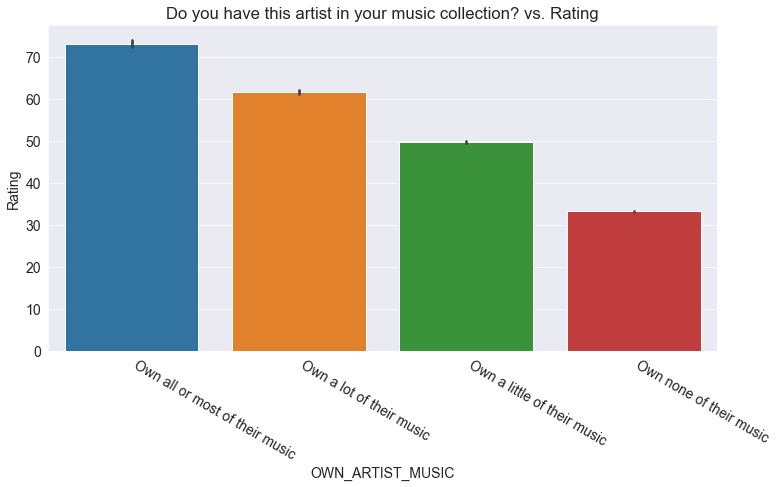

In [48]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Do you have this artist in your music collection? vs. Rating')
sns.barplot(x='OWN_ARTIST_MUSIC', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- OWN_ARTIST_MUSIC is also a key feature.**

### 'LIKE_ARTIST' column - To what extent do you like or dislike listening this artist? 


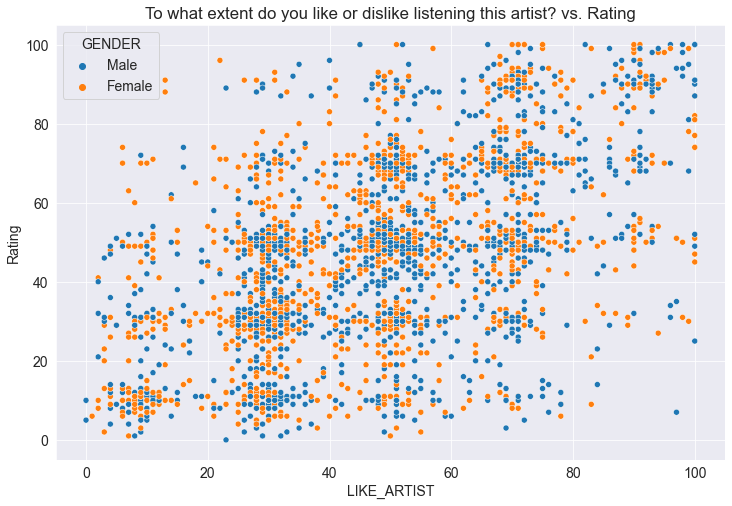

In [49]:
plt.title('To what extent do you like or dislike listening this artist? vs. Rating')
sns.scatterplot(x='LIKE_ARTIST', y='Rating', hue='GENDER', data=train_merged_df.sample(10000));

In [50]:
# Ratings stats of missing 130K
train_merged_df[train_merged_df['LIKE_ARTIST'].isna()].Rating.describe()

count    133662.000000
mean         32.326353
std          20.782582
min           0.000000
25%          12.000000
50%          30.000000
75%          48.000000
max         100.000000
Name: Rating, dtype: float64

In [51]:
# Rating stats of the whole training set
train_merged_df.Rating.describe()

count    188690.000000
mean         36.435391
std          22.586036
min           0.000000
25%          15.000000
50%          32.000000
75%          50.000000
max         100.000000
Name: Rating, dtype: float64

In [52]:
# Ratings stats of 55K who have given a LIKE_ARTIST value
train_merged_df[~train_merged_df['LIKE_ARTIST'].isna()].Rating.describe()

count    55028.000000
mean        46.416170
std         23.653523
min          0.000000
25%         30.000000
50%         48.000000
75%         64.250000
max        100.000000
Name: Rating, dtype: float64

**- From the chart, seems there's a very weak relationship between LIKE_ARTIST and Rating;**

**- However from the 'Rating' stats above, we can see that NaN group in LIKE_ARTIST column has much lower stats than NOT NaN group. Which means this feature column is quite important.**

## words_score (Our custom feature)

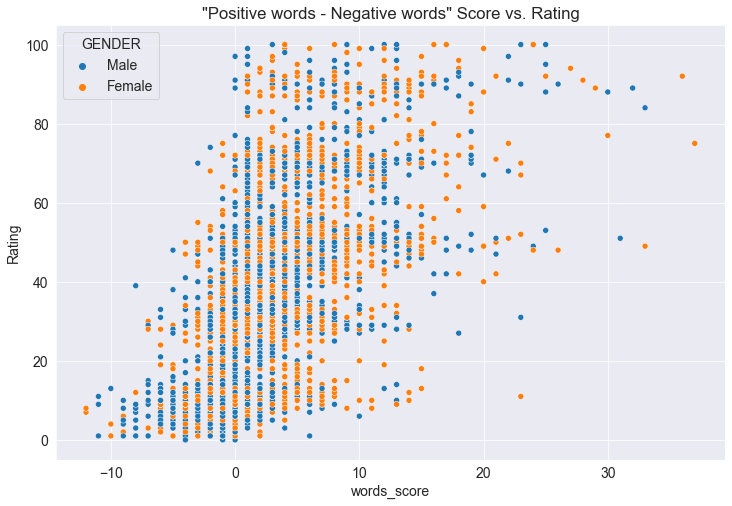

In [53]:
plt.title('"Positive words - Negative words" Score vs. Rating')
sns.scatterplot(x='words_score', y='Rating', hue='GENDER', data=train_merged_df.sample(5000));

**- For words_score, it seems that for extreme values like smaller than -5 or bigger than 15, we'll have a clear impact on the Rating;**

**- For scores in the middle between -5 and 15, the relationship seems to lose quite a lot.**

## Gender column

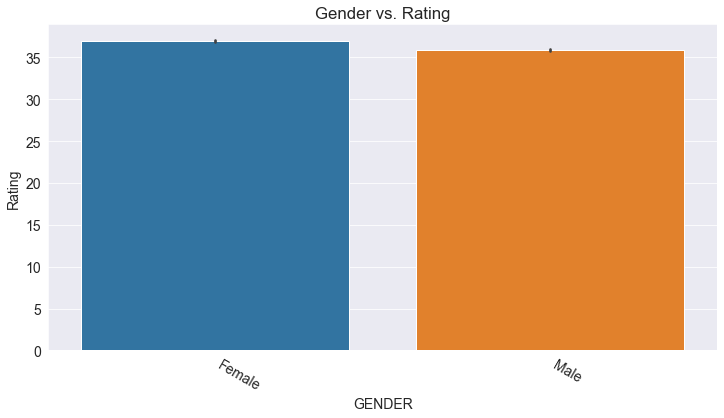

In [54]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Gender vs. Rating')
sns.barplot(x='GENDER', y='Rating', data=train_merged_df)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- Seems that there's a very samll difference in ratings between females and males, with feamles giving a little higher score.**

## Age column

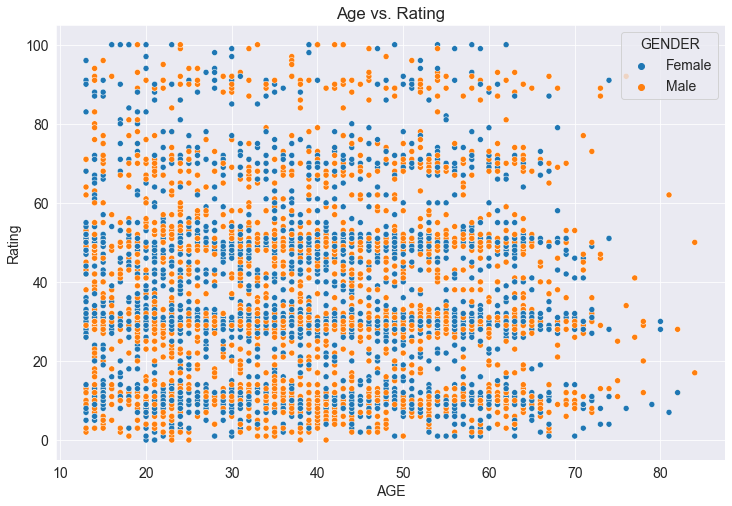

In [55]:
plt.title('Age vs. Rating')
sns.scatterplot(x='AGE', y='Rating', hue='GENDER', data=train_merged_df.sample(5000));

**- Maybe we can divide age into groups in order to have more insights. Let's divide into: 13-17, 18-25, 26-35, 36-50, 51-65, 65+;**

**- Let's create a new column called 'AGE_GROUP' with the above the breakdown.**


In [56]:
train_merged_df['AGE'].describe()

count    174982.000000
mean         39.246923
std          16.035515
min          13.000000
25%          25.000000
50%          39.000000
75%          52.000000
max          94.000000
Name: AGE, dtype: float64

In [57]:
train_merged_df['AGE'].isna().sum()
# To be imputed later with the mean 39

13708

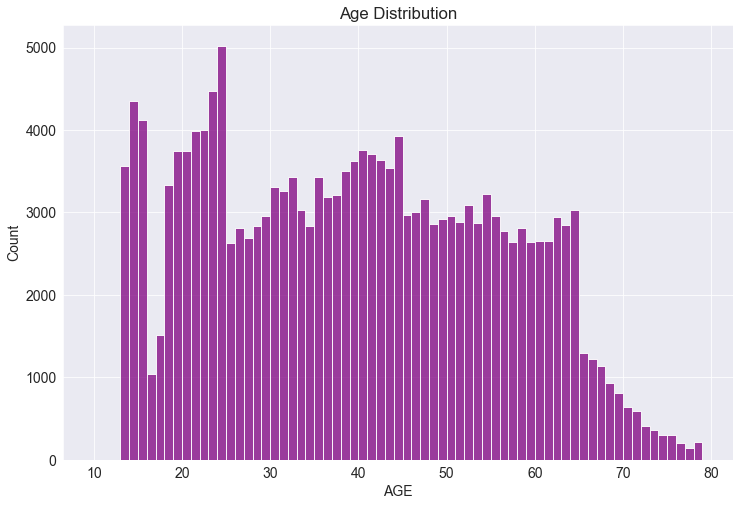

In [58]:
plt.title('Age Distribution')
sns.histplot(train_merged_df.AGE, bins=np.arange(10,80,1), color='purple');

In [59]:
train_merged_df[train_merged_df['AGE'] > 50].AGE.count()

48897

In [60]:
def age_to_categorical(x):
  try:
    if int(x) <= 17:
      return '13-17'
    elif 17< int(x) <= 25:
      return '18-25'
    elif 25< int(x) <= 35:
      return '26-35'
    elif 35< int(x) <= 50:
      return '36-50'
    elif 50< int(x) <= 65:
      return '51-65'
    else:
      return 'older than 65'
  except:
    return np.nan

In [61]:
# Create a new column
train_merged_df['AGE_GROUP'] = train_merged_df['AGE'].apply(lambda x: age_to_categorical(x))

In [62]:
train_merged_df['AGE_GROUP'].value_counts()

36-50            49963
51-65            41315
18-25            30944
26-35            30573
13-17            14605
older than 65     7582
Name: AGE_GROUP, dtype: int64

In [63]:
# Fill the missing value with the mean category:
train_merged_df['AGE_GROUP'].fillna('36-50', inplace=True)
train_merged_df['AGE'].fillna(39, inplace=True)

In [64]:
# Do the same for the test dataset:
test_merged_df['AGE_GROUP'] = test_merged_df['AGE'].apply(lambda x: age_to_categorical(x))
test_merged_df['AGE_GROUP'].fillna('36-50', inplace=True)
test_merged_df['AGE'].fillna(39, inplace=True)

In [65]:
plot_order= train_merged_df.groupby('AGE_GROUP')['Rating'].mean().sort_values(ascending=False).index.values

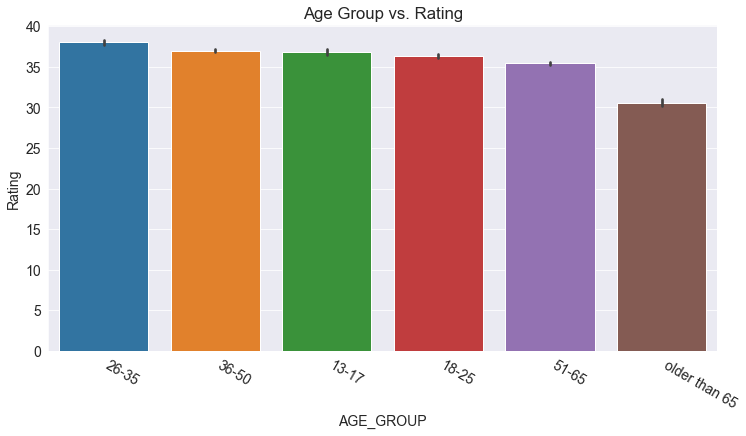

In [66]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Age Group vs. Rating')
sns.barplot(x='AGE_GROUP', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- The difference between age group is not that big;**

**- The only group that stands out is the 'older than 65', which has rating mean lower than others.**

---



## WORKING column

In [67]:
train_merged_df['WORKING'].value_counts()

Employed 30+ hours a week                                 53347
Full-time student                                         20244
Employed 8-29 hours per week                              16284
Retired from full-time employment (30+ hours per week)    13234
Full-time housewife / househusband                        10367
Self-employed                                              7629
Temporarily unemployed                                     7528
Other                                                      5725
Retired from self-employment                               1480
Employed part-time less than 8 hours per week              1480
In unpaid employment (e.g. voluntary work)                 1407
Prefer not to state                                         947
Part-time student                                           873
Name: WORKING, dtype: int64

In [68]:
plot_order= train_merged_df.groupby('WORKING')['Rating'].mean().sort_values(ascending=False).index.values

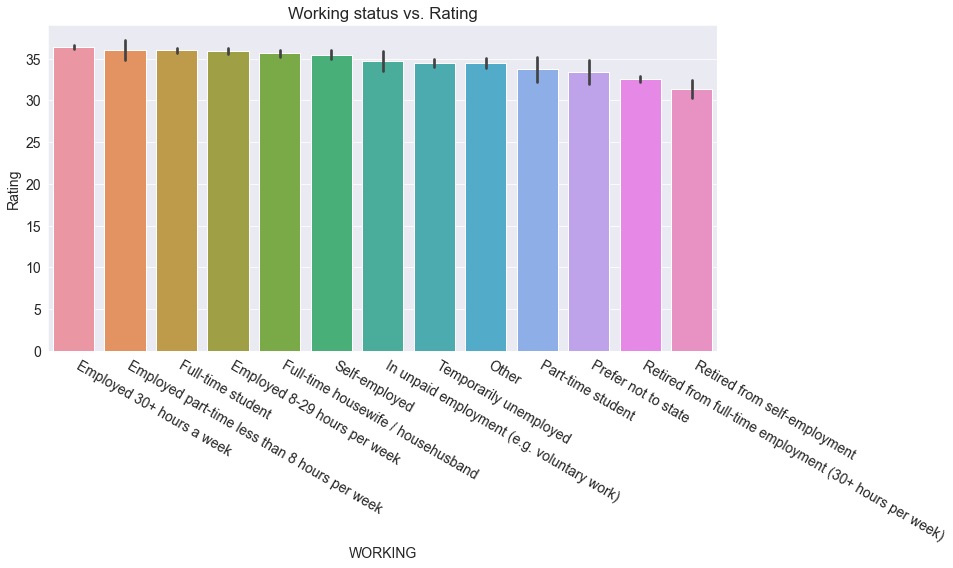

In [69]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Working status vs. Rating')
sns.barplot(x='WORKING', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- Seems like employed users appreciate more music than retired users.**

**- Which interpretation goes along with the AGE_GROUP, both are saying old people/retired people have lower rating than younger/working people.**



## REGION column - The region of the United Kingdom where they live. 

In [70]:
train_merged_df['REGION'].value_counts()

North               58707
South               54005
Midlands            44220
Centre               7284
Northern Ireland     2890
North Ireland         375
Name: REGION, dtype: int64

- Northern Ireland and North Ireland can be combined together:

In [71]:
train_merged_df['REGION'].replace(['North Ireland'], 'Northern Ireland', inplace=True)
test_merged_df['REGION'].replace(['North Ireland'], 'Northern Ireland', inplace=True)

In [72]:
plot_order= train_merged_df.groupby('REGION')['Rating'].mean().sort_values(ascending=False).index.values

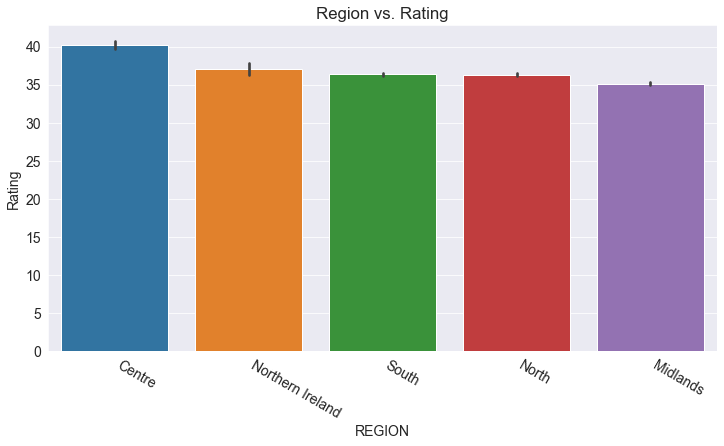

In [73]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Region vs. Rating')
sns.barplot(x='REGION', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();


**- Some small difference in the target stats, in particular between Centre and Midlands.**

## MUSIC column - The respondent’s view on the importance of music in his/her life. 

TO BE TRANFORMED INTO ORDINAL NUMERIC VALUES


In [74]:
train_merged_df['MUSIC'].value_counts()

Music is important to me but not necessarily more important                                    56695
Music means a lot to me and is a passion of mine                                               54793
I like music but it does not feature heavily in my life                                        43023
Music is important to me but not necessarily more important than other hobbies or interests    12977
Music is no longer as important as it used to be to me                                          5702
Music has no particular interest for me                                                         3643
Name: MUSIC, dtype: int64

- Combined 'Music is important to me but not necessarily more important' with 'Music is important to me but not necessarily more important than other hobbies or interests':

In [75]:
train_merged_df['MUSIC'].replace(['Music is important to me but not necessarily more important'], 'Music is important to me but not necessarily more important than other hobbies or interests', inplace=True)
test_merged_df['MUSIC'].replace(['Music is important to me but not necessarily more important'], 'Music is important to me but not necessarily more important than other hobbies or interests', inplace=True)

In [76]:
# Replace NaN with 'No Answer'
train_merged_df['MUSIC'].fillna('No Answer', inplace=True)
test_merged_df['MUSIC'].fillna('No Answer', inplace=True)

In [77]:
train_merged_df['MUSIC'].value_counts()

Music is important to me but not necessarily more important than other hobbies or interests    69672
Music means a lot to me and is a passion of mine                                               54793
I like music but it does not feature heavily in my life                                        43023
No Answer                                                                                      11857
Music is no longer as important as it used to be to me                                          5702
Music has no particular interest for me                                                         3643
Name: MUSIC, dtype: int64

In [78]:
plot_order= train_merged_df.groupby('MUSIC')['Rating'].mean().sort_values(ascending=False).index.values

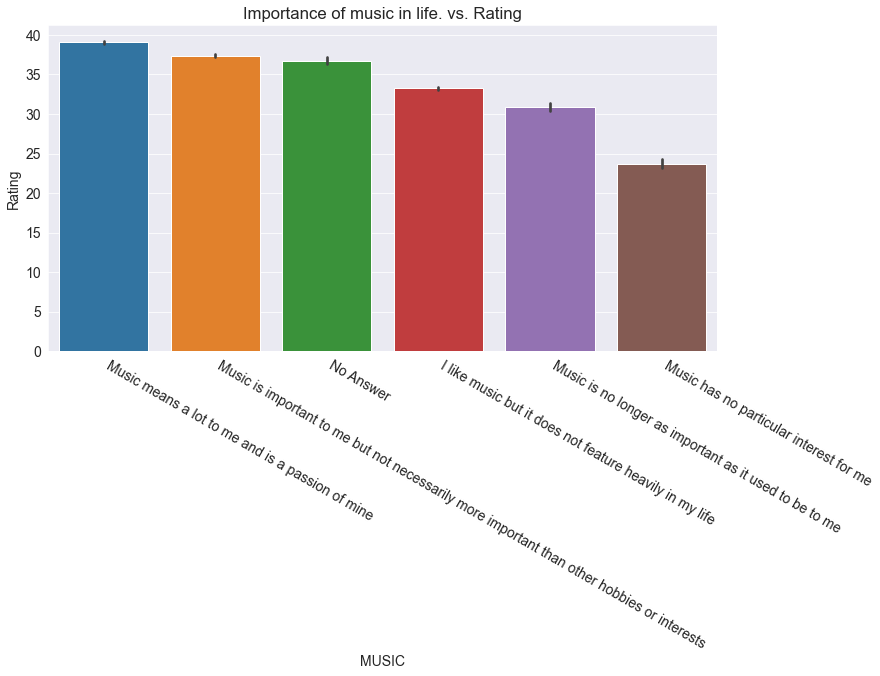

In [79]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('Importance of music in life. vs. Rating')
sns.barplot(x='MUSIC', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- MUSIC column will be pretty important for the  model;**

**- We will convert this column into scaled numeric values.**



## LIST_OWN column - An estimate for the number of daily hours spent listening to music they own or have chosen. 

- Let's clean up the column, and impute 'No Answer' to the NaN values.

In [80]:
train_merged_df['LIST_OWN'].value_counts()

1 hour                29683
2 hours               27505
Less than an hour     26697
3 hours               13078
0 Hours               12367
1                      8801
4 hours                8116
2                      6937
5 hours                4430
3                      2959
0                      2792
6 hours                2744
16+ hours              1978
8 hours                1874
10 hours               1807
4                      1465
7 hours                1164
5                       940
12 hours                774
9 hours                 471
6                       361
11 hours                235
8                       234
15 hours                231
10                      217
14 hours                193
16 hours                130
7                       121
13 hours                106
12                       94
9                        40
15                       22
14                       20
16                       17
20                       13
More than 16 hours  

In [81]:
train_merged_df['LIST_OWN'].isna().sum()

30039

In [82]:
train_merged_df['LIST_OWN'].replace(['0 Hours'], '0', inplace=True)
train_merged_df['LIST_OWN'].replace(['Less than an hour'], '0.5', inplace=True)
train_merged_df['LIST_OWN'].replace(['1 hour'], '1', inplace=True)
train_merged_df['LIST_OWN'].replace(['2 hours'], '2', inplace=True)
train_merged_df['LIST_OWN'].replace(['3 hours'], '3', inplace=True)
train_merged_df['LIST_OWN'].replace(['4 hours'], '4', inplace=True)
train_merged_df['LIST_OWN'].replace(['5 hours'], '5', inplace=True)
train_merged_df['LIST_OWN'].replace(['6 hours'], '6', inplace=True)
train_merged_df['LIST_OWN'].replace(['7 hours'], '7', inplace=True)
train_merged_df['LIST_OWN'].replace(['8 hours'], '8', inplace=True)
train_merged_df['LIST_OWN'].replace(['9 hours'], '9', inplace=True)
train_merged_df['LIST_OWN'].replace(['10 hours'], '10', inplace=True)
train_merged_df['LIST_OWN'].replace(['11 hours'], '11', inplace=True)
train_merged_df['LIST_OWN'].replace(['12 hours'], '12', inplace=True)
train_merged_df['LIST_OWN'].replace(['13 hours'], '13', inplace=True)
train_merged_df['LIST_OWN'].replace(['14 hours'], '14', inplace=True)
train_merged_df['LIST_OWN'].replace(['15 hours'], '15', inplace=True)
train_merged_df['LIST_OWN'].replace(['16 hours'], '16', inplace=True)
train_merged_df['LIST_OWN'].replace(['16+ hours'], '16', inplace=True)
train_merged_df['LIST_OWN'].replace(['More than 16 hours'], '16', inplace=True)

In [83]:
# Fill in missing value with 'No Answer'
train_merged_df['LIST_OWN'].fillna('No Answer', inplace=True)

In [84]:
# Let's do the same for the test set:
test_merged_df['LIST_OWN'].replace(['0 Hours'], '0', inplace=True)
test_merged_df['LIST_OWN'].replace(['Less than an hour'], '0.5', inplace=True)
test_merged_df['LIST_OWN'].replace(['1 hour'], '1', inplace=True)
test_merged_df['LIST_OWN'].replace(['2 hours'], '2', inplace=True)
test_merged_df['LIST_OWN'].replace(['3 hours'], '3', inplace=True)
test_merged_df['LIST_OWN'].replace(['4 hours'], '4', inplace=True)
test_merged_df['LIST_OWN'].replace(['5 hours'], '5', inplace=True)
test_merged_df['LIST_OWN'].replace(['6 hours'], '6', inplace=True)
test_merged_df['LIST_OWN'].replace(['7 hours'], '7', inplace=True)
test_merged_df['LIST_OWN'].replace(['8 hours'], '8', inplace=True)
test_merged_df['LIST_OWN'].replace(['9 hours'], '9', inplace=True)
test_merged_df['LIST_OWN'].replace(['10 hours'], '10', inplace=True)
test_merged_df['LIST_OWN'].replace(['11 hours'], '11', inplace=True)
test_merged_df['LIST_OWN'].replace(['12 hours'], '12', inplace=True)
test_merged_df['LIST_OWN'].replace(['13 hours'], '13', inplace=True)
test_merged_df['LIST_OWN'].replace(['14 hours'], '14', inplace=True)
test_merged_df['LIST_OWN'].replace(['15 hours'], '15', inplace=True)
test_merged_df['LIST_OWN'].replace(['16 hours'], '16', inplace=True)
test_merged_df['LIST_OWN'].replace(['16+ hours'], '16', inplace=True)
test_merged_df['LIST_OWN'].replace(['More than 16 hours'], '16', inplace=True)
test_merged_df['LIST_OWN'].fillna('No Answer', inplace=True)

In [85]:
plot_order= train_merged_df.groupby('LIST_OWN')['Rating'].mean().sort_values(ascending=False).index.values

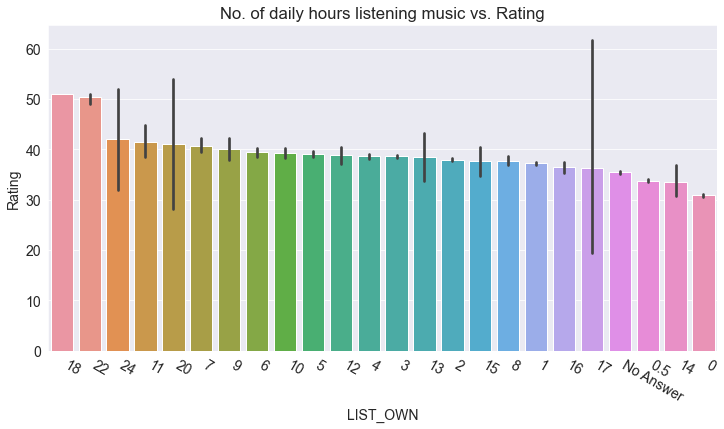

In [86]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('No. of daily hours listening music vs. Rating')
sns.barplot(x='LIST_OWN', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

- The picture is not very clear, let's regroup them into a bunch of categories.

In [88]:
lo_mapper = {'No Answer': 'No Answer', 
          '0': '0', 
          '0.5': '0.5',
          '1': '1',
          '2': '2',
          '3': '3-6',
          '4': '3-6',
          '5': '3-6',
          '6': '3-6',
          '7': '7-10',
          '8': '7-10',
          '9': '7-10',
          '10': '7-10',
          '11': '11-14',
          '12':  '11-14',
          '13': '11-14',
          '14': '11-14',
          '15': '15-19',
          '16': '15-19',
          '17': '15-19',
          '18': '15-19',
          '19': '15-19',
          '20': '20 and plus',
          '21': '20 and plus',
          '22': '20 and plus',
          '23': '20 and plus',
          '24': '20 and plus'
          }

In [89]:
train_merged_df['LIST_OWN'] = train_merged_df['LIST_OWN'].map(lo_mapper)

In [90]:
train_merged_df['LIST_OWN'].value_counts()

1              38484
2              34442
3-6            34093
No Answer      30039
0.5            26697
0              15159
7-10            5928
15-19           2399
11-14           1431
20 and plus       18
Name: LIST_OWN, dtype: int64

In [91]:
plot_order= train_merged_df.groupby('LIST_OWN')['Rating'].mean().sort_values(ascending=False).index.values

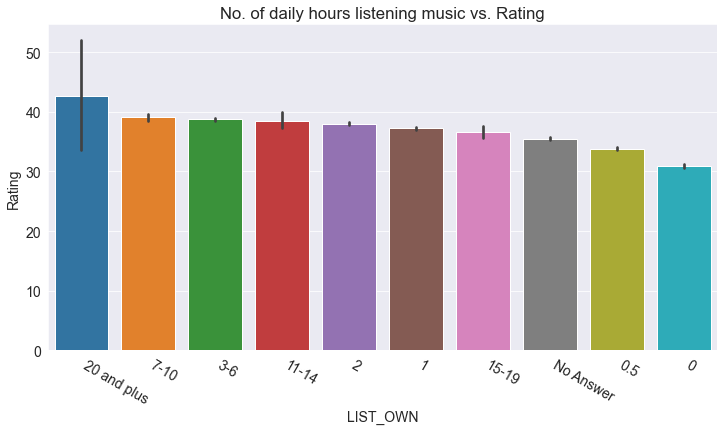

In [92]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('No. of daily hours listening music vs. Rating')
sns.barplot(x='LIST_OWN', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

**- Extreme values in LIST_OWN are quite predictive, however for 3hours to 19 hours the picture is still quite murky.**

In [93]:
# Do the same for the test set:
test_merged_df['LIST_OWN'] = test_merged_df['LIST_OWN'].map(lo_mapper)

## LIST_BACK - number of daily hours the respondent spends listening to background music/music they have not chosen.

In [94]:
train_merged_df['LIST_BACK'].value_counts()

2 hours               24663
1 hour                23409
Less than an hour     22232
3 hours               13679
0 Hours               10565
4 hours               10492
1                      6856
5 hours                6170
2                      6027
6 hours                5099
8 hours                4473
3                      3097
16+ hours              2890
0                      2768
7 hours                2572
10 hours               2544
4                      2284
5                      1587
9 hours                1200
12 hours               1171
6                      1119
8                      1013
7                       498
14 hours                369
11 hours                334
15 hours                325
10                      319
16 hours                278
12                      213
13 hours                213
9                       189
20                       36
More than 16 hours       23
15                       17
14                       14
19                  

In [95]:
train_merged_df['LIST_BACK'].replace(['0 Hours'], '0', inplace=True)
train_merged_df['LIST_BACK'].replace(['Less than an hour'], '0.5', inplace=True)
train_merged_df['LIST_BACK'].replace(['1 hour'], '1', inplace=True)
train_merged_df['LIST_BACK'].replace(['2 hours'], '2', inplace=True)
train_merged_df['LIST_BACK'].replace(['3 hours'], '3', inplace=True)
train_merged_df['LIST_BACK'].replace(['4 hours'], '4', inplace=True)
train_merged_df['LIST_BACK'].replace(['5 hours'], '5', inplace=True)
train_merged_df['LIST_BACK'].replace(['6 hours'], '6', inplace=True)
train_merged_df['LIST_BACK'].replace(['7 hours'], '7', inplace=True)
train_merged_df['LIST_BACK'].replace(['8 hours'], '8', inplace=True)
train_merged_df['LIST_BACK'].replace(['9 hours'], '9', inplace=True)
train_merged_df['LIST_BACK'].replace(['10 hours'], '10', inplace=True)
train_merged_df['LIST_BACK'].replace(['11 hours'], '11', inplace=True)
train_merged_df['LIST_BACK'].replace(['12 hours'], '12', inplace=True)
train_merged_df['LIST_BACK'].replace(['13 hours'], '13', inplace=True)
train_merged_df['LIST_BACK'].replace(['14 hours'], '14', inplace=True)
train_merged_df['LIST_BACK'].replace(['15 hours'], '15', inplace=True)
train_merged_df['LIST_BACK'].replace(['16 hours'], '16', inplace=True)
train_merged_df['LIST_BACK'].replace(['16+ hours'], '16', inplace=True)
train_merged_df['LIST_BACK'].replace(['More than 16 hours'], '16', inplace=True)

In [96]:
# Fill in missing value with 'No Answer'
train_merged_df['LIST_BACK'].fillna('No Answer', inplace=True)

In [97]:
train_merged_df['LIST_BACK'] = train_merged_df['LIST_BACK'].map(lo_mapper)

In [98]:
plot_order= train_merged_df.groupby('LIST_BACK')['Rating'].mean().sort_values(ascending=False).index.values

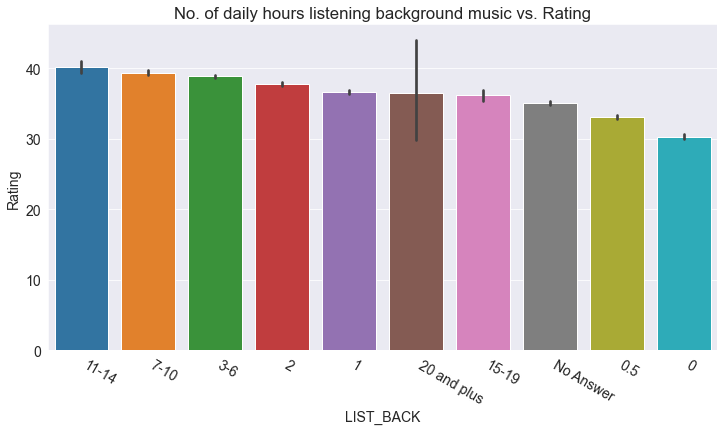

In [99]:
fig, ax = plt.subplots(figsize=(12,6))

# Add the plot
plt.title('No. of daily hours listening background music vs. Rating')
sns.barplot(x='LIST_BACK', y='Rating', data=train_merged_df, order=plot_order)
plt.xticks(rotation=-30, ha='left')
plt.show();

In [100]:
# Do the same for the test set:
test_merged_df['LIST_BACK'].replace(['0 Hours'], '0', inplace=True)
test_merged_df['LIST_BACK'].replace(['Less than an hour'], '0.5', inplace=True)
test_merged_df['LIST_BACK'].replace(['1 hour'], '1', inplace=True)
test_merged_df['LIST_BACK'].replace(['2 hours'], '2', inplace=True)
test_merged_df['LIST_BACK'].replace(['3 hours'], '3', inplace=True)
test_merged_df['LIST_BACK'].replace(['4 hours'], '4', inplace=True)
test_merged_df['LIST_BACK'].replace(['5 hours'], '5', inplace=True)
test_merged_df['LIST_BACK'].replace(['6 hours'], '6', inplace=True)
test_merged_df['LIST_BACK'].replace(['7 hours'], '7', inplace=True)
test_merged_df['LIST_BACK'].replace(['8 hours'], '8', inplace=True)
test_merged_df['LIST_BACK'].replace(['9 hours'], '9', inplace=True)
test_merged_df['LIST_BACK'].replace(['10 hours'], '10', inplace=True)
test_merged_df['LIST_BACK'].replace(['11 hours'], '11', inplace=True)
test_merged_df['LIST_BACK'].replace(['12 hours'], '12', inplace=True)
test_merged_df['LIST_BACK'].replace(['13 hours'], '13', inplace=True)
test_merged_df['LIST_BACK'].replace(['14 hours'], '14', inplace=True)
test_merged_df['LIST_BACK'].replace(['15 hours'], '15', inplace=True)
test_merged_df['LIST_BACK'].replace(['16 hours'], '16', inplace=True)
test_merged_df['LIST_BACK'].replace(['16+ hours'], '16', inplace=True)
test_merged_df['LIST_BACK'].replace(['More than 16 hours'], '16', inplace=True)
test_merged_df['LIST_BACK'].fillna('No Answer', inplace=True)

test_merged_df['LIST_BACK'] = test_merged_df['LIST_BACK'].map(lo_mapper)

## Questionaire (total 19 questions) -  Each of these asks the respondent to rate, on a scale of X-100, whether they agree with the question

### E.g. Q7: I find seeing a new artist / band on TV a useful way of discovering new music 

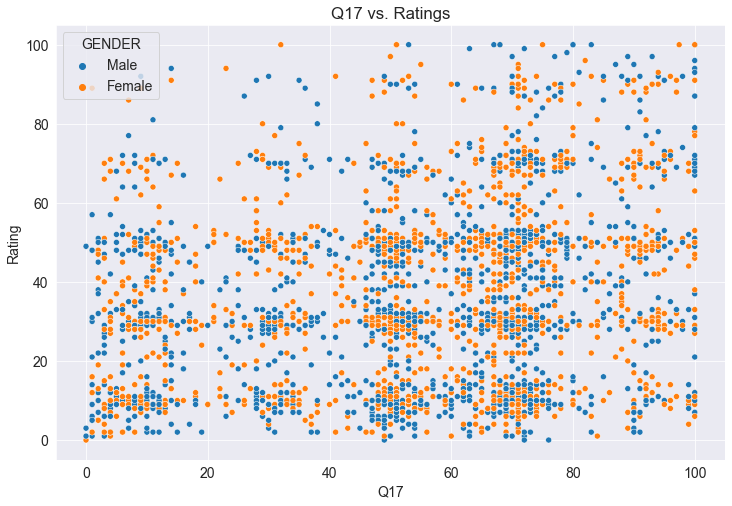

In [101]:
plt.title('Q17 vs. Ratings')
sns.scatterplot(x='Q17', y='Rating', hue='GENDER', data=train_merged_df.sample(3000));

**- The questions covered different aspects of habits of users. Each question looks at music at a different POV, one might be more suitable for music experts, others might more suitable for amateurs.**

**- The relationship between questions and Rating is not that straight forward. If a question highlights the expertise of the user in terms of music taste, it doesn't mean directly that the Ratings will tend to be higher (if user listens more, appreciates more) or be lower (since he/she has a higher taste, maybe more judgemental to give higher rating). We don't see clear relationships here.**

**- The question that probably gives the most information is the number 17, as lower score tend to correspond to lower rating.**

### For the moment, we keep all of the questions and feed them into the model, in a later revision we might consider to select only questions that are more important along with a smaller selection of other features to see if we can improve the model accuracy.

## Preprocessing and Feature Engineering
Let's look at the merged training set

In [102]:
train_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188690 entries, 0 to 188689
Data columns (total 36 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Artist            188690 non-null  int64  
 1   Track             188690 non-null  int64  
 2   User              188690 non-null  int64  
 3   Rating            188690 non-null  int64  
 4   Time              188690 non-null  int64  
 5   HEARD_OF          188690 non-null  object 
 6   OWN_ARTIST_MUSIC  188690 non-null  object 
 7   LIKE_ARTIST       55028 non-null   float64
 8   words_score       186636 non-null  float64
 9   GENDER            176833 non-null  object 
 10  AGE               188690 non-null  float64
 11  WORKING           140545 non-null  object 
 12  REGION            167481 non-null  object 
 13  MUSIC             188690 non-null  object 
 14  LIST_OWN          188690 non-null  object 
 15  LIST_BACK         188690 non-null  object 
 16  Q1                17

### 'HEARD_OF' column preprocessing


Since the categories of HEARD_OF has meanings, we can convert these ORDINAL DATA into Numeric Values:

In [103]:
mapper = {'Heard of and listened to music RECENTLY': 4, 
          'Heard of and listened to music EVER': 3,
          'Heard of': 2,
          'Never heard of': 1}

In [104]:
train_merged_df['HEARD_OF'] = train_merged_df['HEARD_OF'].map(mapper)

In [105]:
#Do the same for the test set:
test_merged_df['HEARD_OF'] = test_merged_df['HEARD_OF'].map(mapper)

In [106]:
train_merged_df['HEARD_OF'].value_counts()

1    98169
2    35493
3    34990
4    20038
Name: HEARD_OF, dtype: int64

### 'OWN_ARTIST_MUSIC' column preprocessing



Again, let's convert Ordinal Data into Numeric Values:

In [107]:
oam_mapper = {'Own all or most of their music': 4, 
          'Own a lot of their music': 3, 
          'Own a little of their music': 2,
          'Own none of their music': 1}

In [108]:
train_merged_df['OWN_ARTIST_MUSIC'] = train_merged_df['OWN_ARTIST_MUSIC'].map(oam_mapper)

In [109]:
# Do the same for the test set:
test_merged_df['OWN_ARTIST_MUSIC'] = test_merged_df['OWN_ARTIST_MUSIC'].map(oam_mapper)

In [110]:
train_merged_df['OWN_ARTIST_MUSIC'].value_counts()

1    160113
2     18721
3      7263
4      2593
Name: OWN_ARTIST_MUSIC, dtype: int64

### 'LIKE_ARTIST' column preprocessing

- We have over 130K missing values;
- The feature has some explaining power, so we choose not to drop it;
- We convert it into a categorical column with following level:
> '1-10'
> '11-20'
> '21-30'
> '31-40'
> '41-50'
> '51-60'
> '61-70'
> '71-80'
> '81-90'
> '91-100'
> 'No Answer'
- In this way later we can then one-hot encoding this column.


In [111]:
train_merged_df['LIKE_ARTIST'].isna().sum()

133662

In [112]:
def to_categorical(x):
  try:
    if 1<= int(x) <= 10:
      return '1-10'
    elif 11<= int(x) <= 20:
      return '11-20'
    elif 21<= int(x) <= 30:
      return '21-30'
    elif 31<= int(x) <= 40:
      return '31-40'
    elif 41<= int(x) <= 50:
      return '41-50'
    elif 51<= int(x) <= 60:
      return '51-60'
    elif 61<= int(x) <= 70:
      return '61-70'
    elif 71<= int(x) <= 80:
      return '71-80'
    elif 81<= int(x) <= 90:
      return '81-90'
    else:
      return '91-100'
  except:
    return np.nan


In [113]:
train_merged_df['LIKE_ARTIST'] = train_merged_df['LIKE_ARTIST'].apply(lambda x: to_categorical(x))

# Do the same for the test set:
test_merged_df['LIKE_ARTIST'] = test_merged_df['LIKE_ARTIST'].apply(lambda x: to_categorical(x))

In [114]:
train_merged_df['LIKE_ARTIST'].fillna('No Answer', inplace=True)

# Do the same for the test set:
test_merged_df['LIKE_ARTIST'].fillna('No Answer', inplace=True)

In [115]:
train_merged_df['LIKE_ARTIST'].value_counts()

No Answer    133662
41-50         11114
21-30          8804
51-60          8244
31-40          6574
61-70          6415
71-80          4976
1-10           2825
91-100         2269
11-20          2126
81-90          1681
Name: LIKE_ARTIST, dtype: int64

## MUSIC column can be converted into Ordinal Numeric Values

In [116]:
train_merged_df['MUSIC'].value_counts()

Music is important to me but not necessarily more important than other hobbies or interests    69672
Music means a lot to me and is a passion of mine                                               54793
I like music but it does not feature heavily in my life                                        43023
No Answer                                                                                      11857
Music is no longer as important as it used to be to me                                          5702
Music has no particular interest for me                                                         3643
Name: MUSIC, dtype: int64

In [117]:
m_mapper = {'Music means a lot to me and is a passion of mine': 6, 
          'Music is important to me but not necessarily more important than other hobbies or interests': 5, 
          'No Answer': 4,
          'I like music but it does not feature heavily in my life': 3,
          'Music is no longer as important as it used to be to me': 2,
          'Music has no particular interest for me': 1,
          }

In [118]:
train_merged_df['MUSIC'] = train_merged_df['MUSIC'].map(m_mapper)

In [119]:
# Do the same for test set:
test_merged_df['MUSIC'] = test_merged_df['MUSIC'].map(m_mapper)

## Fill in missing value for categorical data:

In [120]:
# Fill in missing value with 'No Answer'
train_merged_df['GENDER'].fillna('No Answer', inplace=True)
train_merged_df['WORKING'].fillna('No Answer', inplace=True)
train_merged_df['REGION'].fillna('No Answer', inplace=True)

test_merged_df['GENDER'].fillna('No Answer', inplace=True)
test_merged_df['WORKING'].fillna('No Answer', inplace=True)
test_merged_df['REGION'].fillna('No Answer', inplace=True)

## Training, Validation and Test Sets
Since we have already the test set in a separate file. We choose to split the train_merged_df into Training and Validation Sets.

In [121]:
from sklearn.model_selection import train_test_split

In [122]:
# We put 20% of the data into validation set:
train_df, val_df = train_test_split(train_merged_df, test_size=0.2)

In [123]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)

train_df.shape : (150952, 36)
val_df.shape : (37738, 36)


In [124]:
train_df

,Artist,Track,User,Rating,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,AGE,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,AGE_GROUP
70370,13,31,13560,90,19,3,2,81-90,4.0,Male,53.0,Self-employed,Midlands,2,0.5,2,10.0,93.0,46.0,10.0,8.0,56.0,79.0,72.0,72.0,72.0,88.0,82.0,69.0,98.0,2.0,28.0,69.0,52.0,30.0,51-65
146822,21,49,19258,10,21,1,1,No Answer,0.0,Female,24.0,Employed 30+ hours a week,North,5,3-6,7-10,49.0,49.0,50.0,49.0,12.0,30.0,30.0,29.0,72.0,73.0,46.0,45.0,46.0,50.0,49.0,49.0,49.0,49.0,50.0,18-25
186558,35,92,30452,51,23,1,1,No Answer,3.0,Male,51.0,Employed 30+ hours a week,South,6,3-6,3-6,77.0,100.0,90.0,9.0,9.0,9.0,9.0,7.0,7.0,100.0,82.0,84.0,69.0,71.0,72.0,NaN,73.0,75.0,73.0,51-65
84609,31,79,25551,17,11,1,1,No Answer,-2.0,Male,14.0,Full-time student,Midlands,5,2,1,69.0,58.0,74.0,43.0,43.0,44.0,23.0,23.0,14.0,30.0,72.0,36.0,37.0,51.0,63.0,55.0,69.0,59.0,40.0,13-17
2501,26,64,23993,90,22,1,1,No Answer,10.0,Female,38.0,Full-time housewife / househusband,South,6,1,2,69.0,53.0,71.0,67.0,63.0,28.0,11.0,13.0,67.0,94.0,76.0,27.0,65.0,55.0,56.0,NaN,45.0,44.0,36.0,36-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105435,22,110,32305,12,0,3,1,1-10,4.0,Female,14.0,No Answer,No Answer,5,2,2,51.0,63.0,51.0,33.0,32.0,29.0,30.0,30.0,32.0,48.0,51.0,49.0,38.0,38.0,50.0,30.0,67.0,NaN,NaN,13-17
178878,20,45,17932,29,21,1,1,No Answer,4.0,Female,58.0,Employed 8-29 hours per week,Midlands,3,2,1,47.0,76.0,49.0,14.0,15.0,17.0,16.0,16.0,31.0,72.0,72.0,16.0,74.0,39.0,16.0,58.0,59.0,20.0,15.0,51-65
52975,41,155,41563,30,16,2,1,No Answer,0.0,Male,55.0,Retired from full-time employment (30+ hours p...,Midlands,5,No Answer,3-6,49.0,49.0,49.0,72.0,31.0,31.0,6.0,6.0,48.0,70.0,48.0,49.0,32.0,32.0,9.0,9.0,10.0,10.0,9.0,51-65
36083,15,33,11630,30,19,1,1,No Answer,1.0,Male,30.0,Temporarily unemployed,Midlands,5,2,3-6,49.0,68.0,48.0,67.0,67.0,10.0,7.0,6.0,46.0,48.0,49.0,4.0,29.0,28.0,76.0,5.0,53.0,74.0,49.0,26-35


## Identify Input and Target Columns

In [125]:
# Create 2 lists here:
input_cols = list(train_df.columns)
input_cols.remove('Rating')
input_cols.remove('AGE')

target_col = 'Rating'

We can now create inputs and targets for the training, validation and test sets for further processing and model training.

In [126]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [127]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [128]:
test_inputs = test_merged_df[input_cols].copy()

In [129]:
train_inputs

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,AGE_GROUP
70370,13,31,13560,19,3,2,81-90,4.0,Male,Self-employed,Midlands,2,0.5,2,10.0,93.0,46.0,10.0,8.0,56.0,79.0,72.0,72.0,72.0,88.0,82.0,69.0,98.0,2.0,28.0,69.0,52.0,30.0,51-65
146822,21,49,19258,21,1,1,No Answer,0.0,Female,Employed 30+ hours a week,North,5,3-6,7-10,49.0,49.0,50.0,49.0,12.0,30.0,30.0,29.0,72.0,73.0,46.0,45.0,46.0,50.0,49.0,49.0,49.0,49.0,50.0,18-25
186558,35,92,30452,23,1,1,No Answer,3.0,Male,Employed 30+ hours a week,South,6,3-6,3-6,77.0,100.0,90.0,9.0,9.0,9.0,9.0,7.0,7.0,100.0,82.0,84.0,69.0,71.0,72.0,NaN,73.0,75.0,73.0,51-65
84609,31,79,25551,11,1,1,No Answer,-2.0,Male,Full-time student,Midlands,5,2,1,69.0,58.0,74.0,43.0,43.0,44.0,23.0,23.0,14.0,30.0,72.0,36.0,37.0,51.0,63.0,55.0,69.0,59.0,40.0,13-17
2501,26,64,23993,22,1,1,No Answer,10.0,Female,Full-time housewife / househusband,South,6,1,2,69.0,53.0,71.0,67.0,63.0,28.0,11.0,13.0,67.0,94.0,76.0,27.0,65.0,55.0,56.0,NaN,45.0,44.0,36.0,36-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105435,22,110,32305,0,3,1,1-10,4.0,Female,No Answer,No Answer,5,2,2,51.0,63.0,51.0,33.0,32.0,29.0,30.0,30.0,32.0,48.0,51.0,49.0,38.0,38.0,50.0,30.0,67.0,NaN,NaN,13-17
178878,20,45,17932,21,1,1,No Answer,4.0,Female,Employed 8-29 hours per week,Midlands,3,2,1,47.0,76.0,49.0,14.0,15.0,17.0,16.0,16.0,31.0,72.0,72.0,16.0,74.0,39.0,16.0,58.0,59.0,20.0,15.0,51-65
52975,41,155,41563,16,2,1,No Answer,0.0,Male,Retired from full-time employment (30+ hours p...,Midlands,5,No Answer,3-6,49.0,49.0,49.0,72.0,31.0,31.0,6.0,6.0,48.0,70.0,48.0,49.0,32.0,32.0,9.0,9.0,10.0,10.0,9.0,51-65
36083,15,33,11630,19,1,1,No Answer,1.0,Male,Temporarily unemployed,Midlands,5,2,3-6,49.0,68.0,48.0,67.0,67.0,10.0,7.0,6.0,46.0,48.0,49.0,4.0,29.0,28.0,76.0,5.0,53.0,74.0,49.0,26-35


In [130]:
test_inputs

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,AGE_GROUP
0,1,6,3475,18,3,1,1-10,2.0,Female,Employed 30+ hours a week,South,6,1,3-6,8.0,69.0,27.0,27.0,50.0,27.0,26.0,8.0,51.0,50.0,66.0,49.0,20.0,7.0,8.0,9.0,7.0,4.0,8.0,36-50
1,6,149,39210,15,1,1,No Answer,NaN,Male,Employed 30+ hours a week,Midlands,5,1,1,81.0,67.0,94.0,61.0,53.0,32.0,41.0,42.0,36.0,76.0,70.0,76.0,58.0,61.0,66.0,51.0,75.0,70.0,72.0,26-35
2,40,177,47861,17,1,1,No Answer,-2.0,Female,Other,Midlands,2,0.5,0.5,9.0,94.0,49.0,48.0,49.0,8.0,13.0,56.0,92.0,92.0,55.0,57.0,11.0,57.0,10.0,11.0,91.0,7.0,9.0,51-65
3,31,79,27413,11,1,1,No Answer,0.0,Female,Employed part-time less than 8 hours per week,Midlands,3,1,1,53.0,38.0,51.0,53.0,53.0,53.0,33.0,51.0,47.0,33.0,41.0,45.0,49.0,49.0,49.0,49.0,35.0,52.0,52.0,18-25
4,26,66,23232,22,1,1,No Answer,0.0,No Answer,No Answer,No Answer,4,No Answer,No Answer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125789,14,95,30004,23,2,1,No Answer,12.0,Male,Employed 30+ hours a week,Midlands,6,7-10,3-6,84.0,69.0,100.0,32.0,9.0,28.0,9.0,12.0,50.0,75.0,68.0,72.0,64.0,70.0,75.0,NaN,72.0,56.0,54.0,36-50
125790,10,25,8186,7,1,1,No Answer,6.0,Male,No Answer,North,3,No Answer,3-6,29.0,70.0,30.0,30.0,69.0,14.0,12.0,12.0,70.0,29.0,50.0,48.0,54.0,66.0,10.0,34.0,70.0,NaN,NaN,36-50
125791,40,146,38180,13,2,1,No Answer,3.0,Female,Full-time housewife / househusband,Midlands,6,15-19,7-10,59.0,51.0,51.0,83.0,32.0,43.0,14.0,41.0,71.0,58.0,36.0,43.0,81.0,63.0,45.0,65.0,30.0,46.0,21.0,36-50
125792,22,113,32918,0,3,1,41-50,2.0,Female,No Answer,No Answer,6,0,1,69.0,30.0,76.0,74.0,73.0,11.0,11.0,11.0,92.0,34.0,74.0,72.0,36.0,37.0,9.0,9.0,64.0,NaN,NaN,36-50


## Separate Numeric and Categorical data

In [131]:
numeric_cols = ['Artist', 'Track', 'User', 'Time', 'HEARD_OF', 'OWN_ARTIST_MUSIC', 'words_score', 'MUSIC', 'Q1', 'Q2','Q3','Q4','Q5','Q6','Q7','Q8','Q9','Q10','Q11','Q12','Q13','Q14','Q15','Q16','Q17','Q18','Q19']

categorical_cols = ['LIKE_ARTIST', 'GENDER', 'WORKING', 'REGION', 'LIST_OWN', 'LIST_BACK', 'AGE_GROUP' ]

Let's view some statistics for the numeric columns.

In [132]:
train_inputs[numeric_cols].describe()

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,words_score,MUSIC,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19
count,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,149304.000000,150952.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,141490.000000,114143.000000,141490.000000,112442.000000,112442.000000
mean,22.200454,86.473415,26471.035356,15.661038,1.878789,1.218712,2.696331,4.602503,49.018899,54.543120,51.225547,37.331667,34.505660,39.314061,33.952071,29.154808,47.767034,54.885727,58.616280,53.565164,47.014895,53.352583,39.499665,35.870803,53.774619,42.225746,41.282015
std,14.485657,56.019237,13632.588782,6.439676,1.057305,0.576600,4.854563,1.300038,27.636563,23.864404,26.506955,23.662159,23.271585,25.766890,25.779645,24.278983,27.388573,25.425705,23.837751,25.387786,26.784458,25.914803,26.027956,25.502847,25.951761,25.720473,26.501965
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-16.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.000000,36.000000,17696.000000,12.000000,1.000000,1.000000,0.000000,3.000000,28.000000,43.000000,31.000000,14.000000,12.000000,14.000000,10.000000,9.000000,28.000000,41.000000,48.000000,35.000000,28.000000,33.000000,13.000000,11.000000,35.000000,17.000000,14.000000
50%,22.000000,80.000000,27839.000000,17.000000,1.000000,1.000000,2.000000,5.000000,51.000000,53.000000,52.000000,34.000000,32.000000,35.000000,30.000000,23.000000,50.000000,53.000000,64.000000,53.000000,50.000000,53.000000,36.000000,32.000000,56.000000,47.000000,44.000000
75%,35.000000,142.000000,35943.250000,21.000000,3.000000,1.000000,5.000000,6.000000,70.000000,71.000000,71.000000,52.000000,51.000000,53.000000,52.000000,49.000000,70.000000,72.000000,73.000000,71.000000,68.000000,71.000000,55.000000,52.000000,71.000000,58.000000,57.000000
max,49.000000,183.000000,50927.000000,23.000000,4.000000,4.000000,39.000000,6.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


Let's also check the number of categories in each of the categorical columns.

In [133]:
train_inputs[categorical_cols].nunique()

LIKE_ARTIST    11
GENDER          3
WORKING        14
REGION          6
LIST_OWN       10
LIST_BACK      10
AGE_GROUP       6
dtype: int64

## Imputing Missing Numeric Data

We'll replace missing values with the average value in the column using the SimpleImputer class from sklearn.impute. 

The missing data are not many. Except for Q16, Q18 and Q19 which miss 25% of the data. But considering the marginal impact they might have, it should be ok.

In [134]:
train_merged_df[numeric_cols].isna().sum()

Artist                  0
Track                   0
User                    0
Time                    0
HEARD_OF                0
OWN_ARTIST_MUSIC        0
words_score          2054
MUSIC                   0
Q1                  11857
Q2                  11857
Q3                  11857
Q4                  11857
Q5                  11857
Q6                  11857
Q7                  11857
Q8                  11857
Q9                  11857
Q10                 11857
Q11                 11857
Q12                 11857
Q13                 11857
Q14                 11857
Q15                 11857
Q16                 45936
Q17                 11857
Q18                 48145
Q19                 48145
dtype: int64

In [135]:
from sklearn.impute import SimpleImputer

In [136]:
imputer = SimpleImputer(strategy='mean')

In [137]:
imputer.fit(train_merged_df[numeric_cols])

SimpleImputer()

In [138]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [139]:
train_inputs[numeric_cols].isna().sum()

Artist              0
Track               0
User                0
Time                0
HEARD_OF            0
OWN_ARTIST_MUSIC    0
words_score         0
MUSIC               0
Q1                  0
Q2                  0
Q3                  0
Q4                  0
Q5                  0
Q6                  0
Q7                  0
Q8                  0
Q9                  0
Q10                 0
Q11                 0
Q12                 0
Q13                 0
Q14                 0
Q15                 0
Q16                 0
Q17                 0
Q18                 0
Q19                 0
dtype: int64

## Scaling Numeric Features

In [140]:
from sklearn.preprocessing import MinMaxScaler

In [141]:
scaler = MinMaxScaler()

In [142]:
scaler.fit(train_merged_df[numeric_cols])

MinMaxScaler()

In [143]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [144]:
train_inputs[numeric_cols].describe()

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,words_score,MUSIC,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19
count,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000,150952.000000
mean,0.453070,0.472532,0.519784,0.680915,0.292930,0.072904,0.339931,0.720501,0.490192,0.545427,0.512257,0.373328,0.345089,0.393128,0.339524,0.291555,0.477691,0.548858,0.586167,0.535656,0.470141,0.533522,0.395012,0.358714,0.537736,0.422231,0.412803
std,0.295626,0.306116,0.267689,0.279986,0.352435,0.192200,0.087782,0.260008,0.267564,0.231044,0.256627,0.229086,0.225304,0.249463,0.249586,0.235057,0.265163,0.246159,0.230786,0.245792,0.259314,0.250895,0.251990,0.221765,0.251252,0.221985,0.228730
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.204082,0.196721,0.347478,0.521739,0.000000,0.000000,0.290909,0.400000,0.290000,0.460000,0.320000,0.150000,0.120000,0.160000,0.100000,0.100000,0.290000,0.450000,0.490000,0.400000,0.290000,0.350000,0.140000,0.140000,0.390000,0.300000,0.280000
50%,0.448980,0.437158,0.546645,0.739130,0.000000,0.000000,0.327273,0.800000,0.500000,0.545362,0.512284,0.360000,0.330000,0.390000,0.320000,0.280000,0.490000,0.540000,0.600000,0.535720,0.490000,0.533462,0.395239,0.358732,0.537583,0.422153,0.412752
75%,0.714286,0.775956,0.705780,0.913043,0.666667,0.000000,0.381818,1.000000,0.700000,0.710000,0.700000,0.520000,0.510000,0.520000,0.510000,0.480000,0.690000,0.710000,0.720000,0.710000,0.670000,0.710000,0.540000,0.500000,0.710000,0.520000,0.520000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Encoding Categorical Data

In [145]:
train_merged_df[categorical_cols].isna().sum()

LIKE_ARTIST    0
GENDER         0
WORKING        0
REGION         0
LIST_OWN       0
LIST_BACK      0
AGE_GROUP      0
dtype: int64

In [146]:
train_merged_df[categorical_cols].nunique()

LIKE_ARTIST    11
GENDER          3
WORKING        14
REGION          6
LIST_OWN       10
LIST_BACK      10
AGE_GROUP       6
dtype: int64

In [147]:
from sklearn.preprocessing import OneHotEncoder

In [148]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [149]:
encoder.fit(train_merged_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [150]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))

In [151]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [152]:
train_inputs

,Artist,Track,User,Time,HEARD_OF,OWN_ARTIST_MUSIC,LIKE_ARTIST,words_score,GENDER,WORKING,REGION,MUSIC,LIST_OWN,LIST_BACK,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,AGE_GROUP,LIKE_ARTIST_1-10,LIKE_ARTIST_11-20,LIKE_ARTIST_21-30,LIKE_ARTIST_31-40,LIKE_ARTIST_41-50,LIKE_ARTIST_51-60,LIKE_ARTIST_61-70,LIKE_ARTIST_71-80,LIKE_ARTIST_81-90,LIKE_ARTIST_91-100,LIKE_ARTIST_No Answer,GENDER_Female,GENDER_Male,GENDER_No Answer,WORKING_Employed 30+ hours a week,WORKING_Employed 8-29 hours per week,WORKING_Employed part-time less than 8 hours per week,WORKING_Full-time housewife / househusband,WORKING_Full-time student,WORKING_In unpaid employment (e.g. voluntary work),WORKING_No Answer,WORKING_Other,WORKING_Part-time student,WORKING_Prefer not to state,WORKING_Retired from full-time employment (30+ hours per week),WORKING_Retired from self-employment,WORKING_Self-employed,WORKING_Temporarily unemployed,REGION_Centre,REGION_Midlands,REGION_No Answer,REGION_North,REGION_Northern Ireland,REGION_South,LIST_OWN_0,LIST_OWN_0.5,LIST_OWN_1,LIST_OWN_11-14,LIST_OWN_15-19,LIST_OWN_2,LIST_OWN_20 and plus,LIST_OWN_3-6,LIST_OWN_7-10,LIST_OWN_No Answer,LIST_BACK_0,LIST_BACK_0.5,LIST_BACK_1,LIST_BACK_11-14,LIST_BACK_15-19,LIST_BACK_2,LIST_BACK_20 and plus,LIST_BACK_3-6,LIST_BACK_7-10,LIST_BACK_No Answer,AGE_GROUP_13-17,AGE_GROUP_18-25,AGE_GROUP_26-35,AGE_GROUP_36-50,AGE_GROUP_51-65,AGE_GROUP_older than 65
70370,0.265306,0.169399,0.266263,0.826087,0.666667,0.333333,81-90,0.363636,Male,Self-employed,Midlands,0.2,0.5,2,0.10,0.93,0.46,0.10,0.08,0.56,0.79,0.72,0.72,0.72,0.88,0.82,0.69,0.98,0.02,0.280000,0.69,0.520000,0.300000,51-65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
146822,0.428571,0.267760,0.378149,0.913043,0.000000,0.000000,No Answer,0.290909,Female,Employed 30+ hours a week,North,0.8,3-6,7-10,0.49,0.49,0.50,0.49,0.12,0.30,0.30,0.29,0.72,0.73,0.46,0.45,0.46,0.50,0.49,0.490000,0.49,0.490000,0.500000,18-25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
186558,0.714286,0.502732,0.597954,1.000000,0.000000,0.000000,No Answer,0.345455,Male,Employed 30+ hours a week,South,1.0,3-6,3-6,0.77,1.00,0.90,0.09,0.09,0.09,0.09,0.07,0.07,1.00,0.82,0.84,0.69,0.71,0.72,0.358732,0.73,0.750000,0.730000,51-65,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
84609,0.632653,0.431694,0.501718,0.478261,0.000000,0.000000,No Answer,0.254545,Male,Full-time student,Midlands,0.8,2,1,0.69,0.58,0.74,0.43,0.43,0.44,0.23,0.23,0.14,0.30,0.72,0.36,0.37,0.51,0.63,0.550000,0.69,0.590000,0.400000,13-17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2501,0.530612,0.349727,0.471125,0.956522,0.000000,0.000000,No Answer,0.472727,Female,Full-time housewife / househusband,South,1.0,1,2,0.69,0.53,0.71,0.67,0.63,0.28,0.11,0.13,0.67,0.94,0.76,0.27,0.65,0.55,0.56,0.358732,0.45,0.440000,0.360000,36-50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

## Saving Processed Data to Disk

In [153]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)

train_inputs: (150952, 94)
train_targets: (150952,)
val_inputs: (37738, 94)
val_targets: (37738,)
test_inputs: (125794, 94)


In [154]:
!pip install pyarrow --quiet

In [155]:
# Save processed input data
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

In [158]:
# Save processed target data
%%time
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')

UsageError: Line magic function `%%time` not found.


## Let's read the data back:

In [159]:
train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')

train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]

In [160]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)

train_inputs: (150952, 94)
train_targets: (150952,)
val_inputs: (37738, 94)
val_targets: (37738,)
test_inputs: (125794, 94)


## Modeling:
Our first choice is XGBoost model, as generally its performance is better than other models: https://xgboost.readthedocs.io/en/latest/.

Then we will use also another ensembled method: RandomForestRegressor. Detail on this model can be found here: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html.

We extract all the numerical data for training:

In [161]:
X = train_inputs[numeric_cols + encoded_cols]

X_val = val_inputs[numeric_cols + encoded_cols]

X_test = test_inputs[numeric_cols + encoded_cols]

### Training

To train a GBM, we can use the `XGBRegressor` class from the [`XGBoost`](https://xgboost.readthedocs.io/en/latest/) library.

In [162]:
from xgboost import XGBRegressor

In [163]:
# Let's create the model object with standard hyper-parameters, we will tune it later:
model = XGBRegressor(n_jobs=-1)

In [164]:
# Train the model
model.fit(X, train_targets)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=-1, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

## Prediction

In [165]:
preds = model.predict(X)

## Evaluation

In [166]:
from sklearn.metrics import mean_squared_error

def rmse(a, b):
  return mean_squared_error(a, b, squared=False)

In [167]:
rmse(preds, train_targets)

14.070388898596969

## Feature Importance

In [168]:
importance_df = pd.DataFrame({'feature': X.columns,
'importance': model.feature_importances_}).sort_values('importance', ascending=False)

In [169]:
importance_df.head(10)

,feature,importance
6,words_score,0.273948
5,OWN_ARTIST_MUSIC,0.085025
57,REGION_No Answer,0.058251
36,LIKE_ARTIST_91-100,0.035187
27,LIKE_ARTIST_1-10,0.027322
3,Time,0.024524
35,LIKE_ARTIST_81-90,0.018935
33,LIKE_ARTIST_61-70,0.016878
34,LIKE_ARTIST_71-80,0.015363
4,HEARD_OF,0.013913


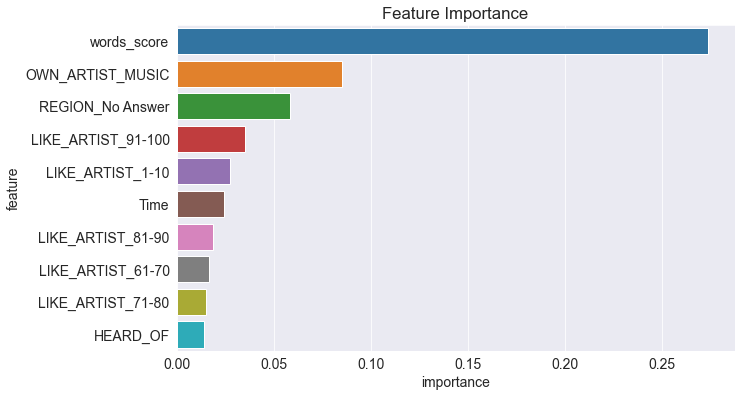

In [170]:
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

**- The top feature is our custom-made feature: words_score which has a weight of nearly 0.3;**

**- OWN_ARTIST_MUSIC and LIKE_ARTIST are also very important.**

## Hyperparameter Tuning and Regularization

In [171]:
def test_params(**params):
  model = XGBRegressor(n_jobs=-1, **params)
  model.fit(X, train_targets)
  train_rmse = rmse(model.predict(X), train_targets)
  val_rmse = rmse(model.predict(X_val), val_targets)
  print('Train RMSE: {}, Validation RMSE: {}'.format(train_rmse, val_rmse))

### no. of estimators / no. of trees

In [172]:
test_params(n_estimators=150)

Train RMSE: 13.524862144108303, Validation RMSE: 14.953743871887069


In [173]:
test_params(n_estimators=300)

Train RMSE: 12.290212108743576, Validation RMSE: 14.61554686163533


In [174]:
test_params(n_estimators=500)

Train RMSE: 11.191003813581812, Validation RMSE: 14.439492297830698


### Tree Depth

In [175]:
test_params(n_estimators=150, max_depth=7)

Train RMSE: 12.409221008539824, Validation RMSE: 14.706765386536663


In [176]:
test_params(n_estimators=150, max_depth=8)

Train RMSE: 11.164081443571703, Validation RMSE: 14.479578836096213


In [177]:
test_params(n_estimators=150, max_depth=9)

Train RMSE: 9.758985526305622, Validation RMSE: 14.364491763967202


### Learning_rate

In [178]:
test_params(n_estimators=150, max_depth=10, learning_rate=0.25)

Train RMSE: 8.810061888211987, Validation RMSE: 14.32488391562702


In [179]:
test_params(n_estimators=150, max_depth=10, learning_rate=0.2)

Train RMSE: 9.597575560418043, Validation RMSE: 14.275398575638174


### Booster

In [180]:
test_params(booster='gblinear', n_estimators=150)

Train RMSE: 17.007006688618628, Validation RMSE: 17.042778781922873


### Best combination of hyper-parameters:



In [181]:
test_params(n_estimators=500, max_depth=9, learning_rate=0.2)

Train RMSE: 7.290599574873428, Validation RMSE: 14.181925605495522


In [182]:
test_params(n_estimators=500, max_depth=9, learning_rate=0.15)

Train RMSE: 8.160301219547108, Validation RMSE: 14.102371574484573


In [183]:
test_params(n_estimators=1000, max_depth=10, learning_rate=0.10, subsample=0.9, colsample_bytree=0.7)

Train RMSE: 5.805459638598001, Validation RMSE: 14.111989591070953


## In order to improve the performance 

- We're going to use K-Fold Cross Validation, maybe we can improve still the model;
- The second thing we're going to do is to use another model: specifically RandomForestRegressor.


## Training using the whole training set:

In [184]:
from sklearn.model_selection import KFold

In [185]:
def train_and_evaluate(X_train_k, Y_train_k, X_val_k, Y_val_k, **params):
  model = XGBRegressor(n_jobs=-1, **params)
  model.fit(X_train_k, Y_train_k)
  train_rmse = rmse(model.predict(X_train_k), Y_train_k)
  val_rmse = rmse(model.predict(X_val_k), Y_val_k)
  return model, train_rmse, val_rmse

In [186]:
kfold = KFold(n_splits=5)

In [187]:
models = []

for train_idxs, val_idxs in kfold.split(X):
  X_train_k, Y_train_k = X.iloc[train_idxs], train_targets.iloc[train_idxs]
  X_val_k, Y_val_k = X.iloc[val_idxs], train_targets.iloc[val_idxs]
  model, train_rmse, val_rmse = train_and_evaluate(X_train_k, Y_train_k, X_val_k, Y_val_k, n_estimators=500, max_depth=9, learning_rate=0.10, subsample=0.9, colsample_bytree=0.7)
  models.append(model)
  print('Train RMSE: {}, Validation RMSE: {}'.format(train_rmse, val_rmse))

Train RMSE: 8.882026546878167, Validation RMSE: 14.151609946425012
Train RMSE: 8.836241386875717, Validation RMSE: 14.21269813975624
Train RMSE: 8.903668317268863, Validation RMSE: 14.279280644422645
Train RMSE: 8.8360514134182, Validation RMSE: 14.366084685994306
Train RMSE: 8.961553346725028, Validation RMSE: 14.376067388234425


In [188]:
def predict_avg(models, inputs):
    return np.mean([model.predict(inputs) for model in models], axis=0)

In [189]:
preds_kfold = predict_avg(models, X_val)
rmse(preds_kfold, val_targets)

13.921898121591452

**Ensembled methods seem offer a big boost in performance!**

**If the test set performance can be similar, it would be 15th place on the Leaderboard, which is pretty good.**

## Let's make the final Test Prediction for the Competition: (unfortunately the competition is closed and not accepting new submission, so we won't know how we rank.)

In [190]:
test_preds = predict_avg(models, X_test)

In [191]:
test_preds.shape

(125794,)

## As an alternative, let's use a different model: **RandomForestRegressor**

In [192]:
from sklearn.ensemble import RandomForestRegressor

In [193]:
model_rf = RandomForestRegressor()

In [194]:
model_rf.fit(X, train_targets)

RandomForestRegressor()

In [195]:
preds_rf = model.predict(X_val)
rmse(preds_rf, val_targets)

14.293008935359476

**The performance of RandomForestRegressor is less impressive than XGBoost.**

**We'll use XGBoost for any future predictions.**

## Let's see the most important features of our XGBRegressors:



In [197]:
importance_df = pd.DataFrame({'feature': X.columns,
'importance': model.feature_importances_}).sort_values('importance', ascending=False)

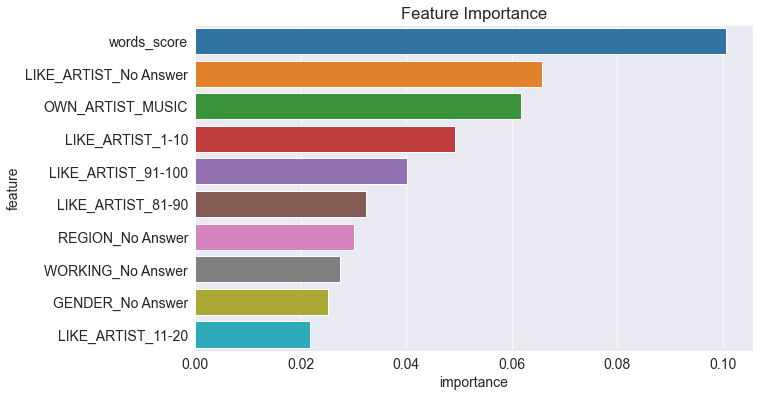

In [198]:
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

- It's good to see that our own customized feature 'words_score' is the most important. That shows the importance of feature engineering;
- OWN_ARTIST_MUSIC, LIKE_ARTIST are also pretty important.

## Saving the trained models:

In [199]:
import joblib

In [200]:
# Create a dictionary:
emi_music = {
    'model': models,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_cols': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [201]:
joblib.dump(emi_music, 'emi_music.joblib')

['emi_music.joblib']

In [202]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "mmali9719/course-project-real-world-machine-learning-model" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/mmali9719/course-project-real-world-machine-learning-model


'https://jovian.ai/mmali9719/course-project-real-world-machine-learning-model'

In [203]:
jovian.submit(assignment="zerotogbms-project")

<IPython.core.display.Javascript object>

[jovian] Updating notebook "mmali9719/course-project-real-world-machine-learning-model" on https://jovian.ai/
[jovian] Committed successfully! https://jovian.ai/mmali9719/course-project-real-world-machine-learning-model
[jovian] Submitting assignment..
[jovian] Verify your submission at https://jovian.ai/learn/machine-learning-with-python-zero-to-gbms/assignment/course-project-real-world-machine-learning-model
